# Time-Series Forecasting with XGBoost!

## Tutorial
Working through XGBoost in Python!

https://www.datacamp.com/tutorial/xgboost-in-python

In [23]:
import seaborn as sns
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import train_test_split

import warnings

In [2]:
warnings.filterwarnings("ignore")

diamonds = sns.load_dataset("diamonds")

In [3]:
diamonds.head(n=5)
diamonds.shape

(53940, 10)

In [4]:
diamonds.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [5]:
type(diamonds[['price']])
type(diamonds['price'])

pandas.core.series.Series

In [6]:


# Extract feature and target arrays
X, y = diamonds.drop('price', axis=1), diamonds[['price']]

In [7]:
# Extract text features
cats = X.select_dtypes(exclude=np.number).columns.tolist()

# Convert to Pandas category
for col in cats:
   X[col] = X[col].astype('category')

In [8]:
X.dtypes

carat       float64
cut        category
color      category
clarity    category
depth       float64
table       float64
x           float64
y           float64
z           float64
dtype: object

In [9]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, train_size=0.75)

In [10]:
# Create regression matrices

## This creates XGBoosts "DMatrix" datatype which is optimized for XGBoost
## Instead of using encoders like One Hot Encoder, changing column types to 
## Category and then passing in enable_categorical=True allows for XGBoost
## to treat those columns as categorical variables 

dtrain_reg = xgb.DMatrix(X_train, y_train, enable_categorical=True)
dtest_reg = xgb.DMatrix(X_test, y_test, enable_categorical=True)

In [11]:
# Define hyperparameters
# objective is the Objective function
##                  in this case its reg:squarederror (Root MSE)
##                   others include binary:logistic and multi:softprob
## tree method is the model, gpu_hist accelerates on a GPU if possible
##                  alternative is hist, which is for no gpu
params = {"objective": "reg:squarederror", "tree_method": "hist"}

# num_boost_round is the number of rounds used to minimize RMSE
n = 100
model = xgb.train(
   params=params,
   dtrain=dtrain_reg,
   num_boost_round=n,
)

In [12]:
from sklearn.metrics import mean_squared_error

# using the model to predict (inference) using the Test DMatrix
preds = model.predict(dtest_reg)

In [13]:
rmse = mean_squared_error(y_test, preds, squared=False)

print(f"RMSE of the base model: {rmse:.3f}")

RMSE of the base model: 552.861


Better way to evaluate and check for model performance

In [14]:
# reinitializing the hyperparamters

params = {"objective": "reg:squarederror", "tree_method": "hist"}
n = 100

In [15]:
# create a list of tuples
# where the first element of each tuple is the matrix
# and the second element is the name
evals = [(dtrain_reg, "train"), (dtest_reg, "validation")]

In [16]:
evals = [(dtrain_reg, "train"), (dtest_reg, "validation")]

model = xgb.train(
   params=params,
   dtrain=dtrain_reg,
   num_boost_round=n,
   evals=evals,
   verbose_eval=10 # Every ten rounds
)

[0]	train-rmse:2874.49146	validation-rmse:2817.90814
[10]	train-rmse:548.36512	validation-rmse:592.03160
[20]	train-rmse:491.09887	validation-rmse:558.53485
[30]	train-rmse:469.58201	validation-rmse:555.51015
[40]	train-rmse:454.32953	validation-rmse:554.45666
[50]	train-rmse:438.68033	validation-rmse:554.13365
[60]	train-rmse:425.38361	validation-rmse:551.57888
[70]	train-rmse:414.71115	validation-rmse:549.26109
[80]	train-rmse:405.41008	validation-rmse:549.03952
[90]	train-rmse:391.04269	validation-rmse:551.87206
[99]	train-rmse:383.48826	validation-rmse:552.86131


Adding Early stopping because we want a high n for better performance, but we don't want to overfit to the training data

In [17]:
n = 10000


model = xgb.train(
   params=params,
   dtrain=dtrain_reg,
   num_boost_round=n,
   evals=evals,
   verbose_eval=50,
   # Activate early stopping
   early_stopping_rounds=50
)

[0]	train-rmse:2874.49146	validation-rmse:2817.90814
[50]	train-rmse:438.68033	validation-rmse:554.13365
[100]	train-rmse:381.96310	validation-rmse:553.73941
[129]	train-rmse:357.32858	validation-rmse:552.90303


To prevent the model from leaking out (overfitting on one test and on train dataset), we can use cross validation through k-fold cross validation. 

To do this in XGBoost, use the `.cv()` function with the `nfold` parameter instead of train

`nfold` in cross-validation specifies how many times to split the training data into mini training/testing data sets

In [18]:
params = {"objective": "reg:squarederror", "tree_method": "hist"}
n = 1000

results = xgb.cv(
   params, dtrain_reg,
   num_boost_round=n,
   nfold=5,
   early_stopping_rounds=20
)

In [19]:
# Each row in the results dataframe corresponds to a boosting round
results.head()

# To find the best score find the minimum (and argmin) test-rmse-mean
best_rmse = results['test-rmse-mean'].min()

best_rmse

np.float64(550.2735543625861)

### Classification

In [20]:
from sklearn.preprocessing import OrdinalEncoder

X, y = diamonds.drop("cut", axis=1), diamonds[['cut']]

# Encode y to numeric
y_encoded = OrdinalEncoder().fit_transform(y)

# Extract text features
cats = X.select_dtypes(exclude=np.number).columns.tolist()

# Convert to pd.Categorical
for col in cats:
   X[col] = X[col].astype('category')

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, random_state=1, stratify=y_encoded)

In [21]:
# Create classification matrices
dtrain_clf = xgb.DMatrix(X_train, y_train, enable_categorical=True)
dtest_clf = xgb.DMatrix(X_test, y_test, enable_categorical=True)

In [22]:
#                                    Must specify how many classe to classify                                  
params = {"objective": "multi:softprob", "tree_method": "hist", "num_class": 5}
n = 1000

results = xgb.cv(
   params, dtrain_clf,
   num_boost_round=n,
   nfold=5,
    # can specify which metrics to use to report model performance during cross validation
    # Recall that this trains on mlogloss because "objective": "multi-softprob" in params
   metrics=["mlogloss", "auc", "merror"],
)

KeyboardInterrupt: 

In [ ]:
results['test-auc-mean'].max()

np.float64(0.9403142584087144)

## Data Formatting and Preprocessing
* Extract the statistic
* Lag it?
* Remove the Diddy games (and any games after for the season)
* Train Test Split
* Train and validate with XGBoost

In [24]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error

In [3]:
def extract_df(player_name: str, sort_by_date: bool = False):
    first_name = player_name.split(" ")[0].lower()
    last_name = player_name.split(" ")[1].lower()

    playoffs_df = pd.read_csv(f"./career_data/{first_name}_{last_name}_playoffs.csv")
    regular_df = pd.read_csv(f"./career_data/{first_name}_{last_name}_regular.csv")

    # Remove "team_id", "opp_id", "game_result" from regular_df
    regular_df = regular_df.drop(["team_id", "opp_id", "game_result"], axis=1)

    # Remove "Unnamed: 0" from both
    regular_df = regular_df.drop(["Unnamed: 0"], axis=1)
    playoffs_df = playoffs_df.drop(["Unnamed: 0"], axis=1)

    # Add "season" to playoffs_df
    playoffs_df["season"] = "playoffs"
    
    playoffs_df = playoffs_df.loc[pd.notna(playoffs_df['mp'])]
    
    result_df = pd.concat([regular_df, playoffs_df])

    if sort_by_date:
        result_df = result_df.sort_values(by = 'date_game').reset_index().drop("index", axis = 1)
    
    # Parse minutes played into a int
    def parse_time(time):
        minutes, seconds = map(int, time.split(':'))
        return minutes + seconds / 60
    
    result_df['mp'] = result_df['mp'].apply(parse_time)

    return result_df

In [4]:
def get_time_features(df: pd.DataFrame):
    df = df.copy()
    
    df['date_game'] = pd.to_datetime(df['date_game'])

    df['day'] = df['date_game'].dt.dayofyear
    df['month'] = df['date_game'].dt.month
    df['year'] = df['date_game'].dt.year

    return df

In [5]:
def lag_stat(df: pd.DataFrame, stat: str, num_lag: int): 

    df = df.copy()
    for i in range(1, num_lag + 1):
        df[f"{stat}-{i}"] = df[[stat]].shift(i)

    return df

In [6]:
def diddy_game_dates(player_name):
    diddy_df = pd.read_csv("./Diddy-Stats/diddygames.csv") 
    return diddy_df.loc[diddy_df['player'] == player_name]['date'].sort_values().to_list()

In [7]:
# Plot variable significance
def plot_significance(reg):
    fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
    fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
    plt.show()

In [51]:
# Plot Prediction 
def plot_prediction(reg, X_train, y_train, X_test, y_test, stat, plot_last_n = "all", plt_title = ""):
    X_test = X_test.copy()
    X_train = X_train.copy()

    # Add predictions to the test and train sets
    X_test['y_pred'] = reg.predict(X_test)
    X_train['y_pred'] = reg.predict(X_train)

    # Combine features and targets for train and test
    test = pd.DataFrame.join(X_test, y_test)
    train = pd.DataFrame.join(X_train, y_train)

    # Plot test data
    ax = test[[stat]].plot(figsize=(20, 10), label='Test Actual')
    test['y_pred'].plot(ax=ax, style='.', label='Test Predicted')

    if plot_last_n != "all":
        train = train.iloc[-plot_last_n:]
    # Plot train data
    train[[stat]].plot(ax=ax, label='Train Actual', linestyle='--')
    train['y_pred'].plot(ax=ax, style='x', label='Train Predicted')

    plt.title(plt_title)
    # Add legend and show the plot
    plt.legend()
    plt.show()


### Testing a Model on Pau Gasol

* Questions to investigate with Pau
    * How many games should I lag
    * Should lag work between seasons?
    * How many games should I include
    * What stats should I lag in conjugation with pts (trb, ast,...?)

<Axes: xlabel='date_game'>

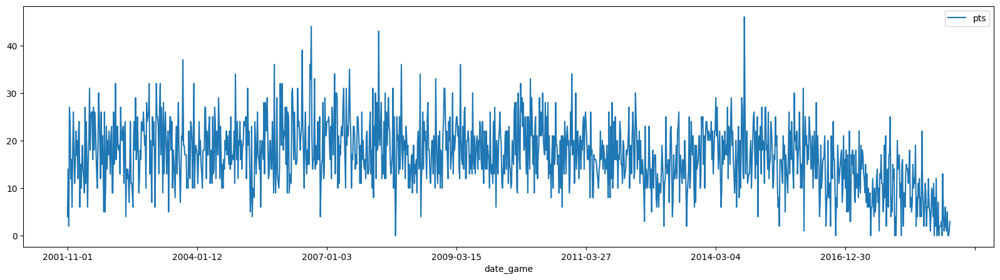

In [ ]:
pau = extract_df("Pau Gasol", sort_by_date=True)

pau.plot(x = "date_game", y = "pts",
         figsize=(20, 5))

In [ ]:
# Finding the dates of the games that Diddy went to 
diddy_game_dates("Pau Gasol")

['2008-05-29',
 '2008-06-15',
 '2009-04-27',
 '2009-05-04',
 '2009-06-07',
 '2010-06-15',
 '2011-01-07',
 '2013-10-29']

In [ ]:
# Adding pts (3-days) lag and date information
pau = get_time_features(pau)
pau = lag_stat(pau, 'pts', 3)

In [ ]:
pau.head()
print(pau.columns)

Index(['date_game', 'mp', 'fg', 'fga', 'fg_pct', 'fg3', 'fg3a', 'fg3_pct',
       'ft', 'fta', 'ft_pct', 'orb', 'drb', 'trb', 'ast', 'stl', 'blk', 'tov',
       'pf', 'pts', 'game_score', 'plus_minus', 'season', 'player', 'day',
       'month', 'year', 'pts-1', 'pts-2', 'pts-3'],
      dtype='object')


In [ ]:
# Getting the correct columns
pau_try_1 = pau[['date_game', 'pts', 'day', 'month', 'year', 'pts-1', 'pts-2', 'pts-3']]
pau_try_1 = pau_try_1.set_index('date_game')

In [ ]:
# Let's target Pau's first Diddy Game
pau_try_1 = pau_try_1.loc[pau_try_1.index < '05-29-2008']

In [ ]:
tss = TimeSeriesSplit(n_splits = 5, test_size=10, gap = 0)

[0]	validation_0-rmse:19.32755	validation_1-rmse:22.91497
[100]	validation_0-rmse:8.71629	validation_1-rmse:13.09412
[200]	validation_0-rmse:4.85103	validation_1-rmse:10.85999
[300]	validation_0-rmse:3.19765	validation_1-rmse:10.41529
[394]	validation_0-rmse:2.38486	validation_1-rmse:10.28906


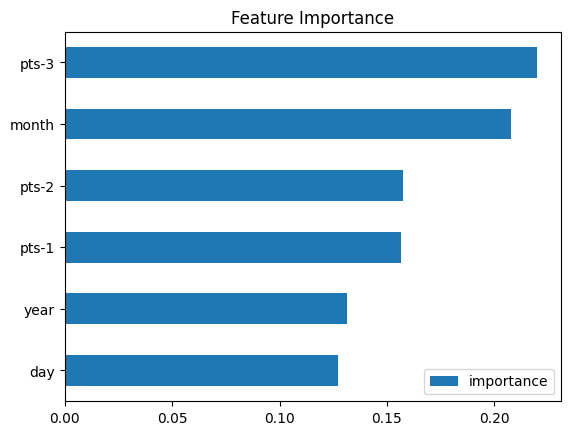

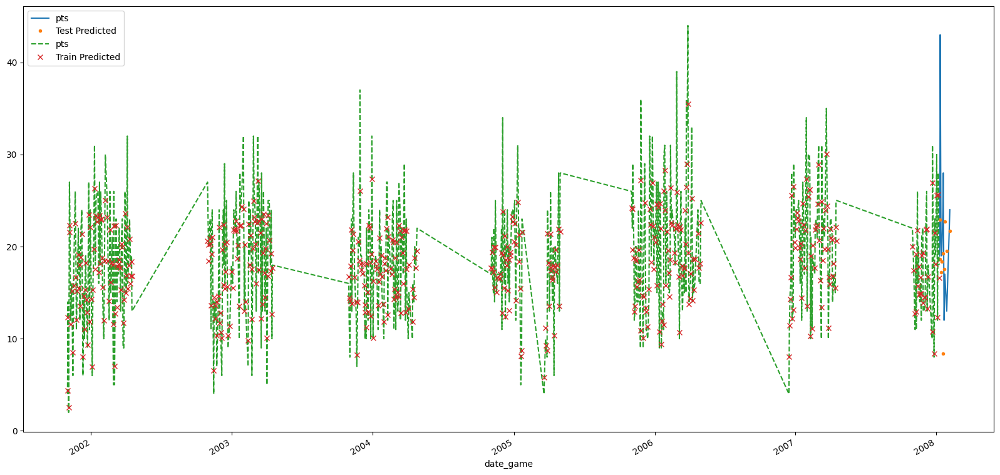

[0]	validation_0-rmse:19.40696	validation_1-rmse:21.31091
[100]	validation_0-rmse:8.78551	validation_1-rmse:9.32590
[200]	validation_0-rmse:4.72005	validation_1-rmse:6.63991
[296]	validation_0-rmse:3.04543	validation_1-rmse:6.58230


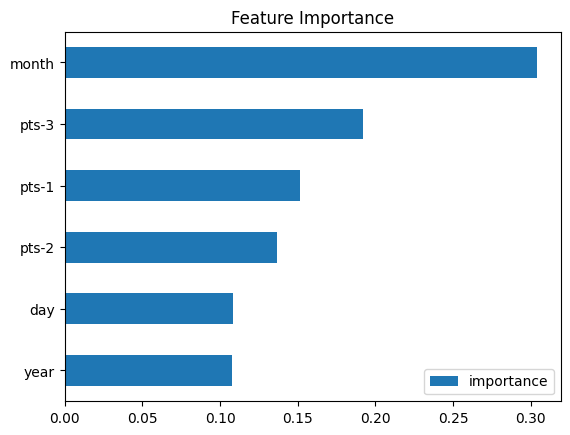

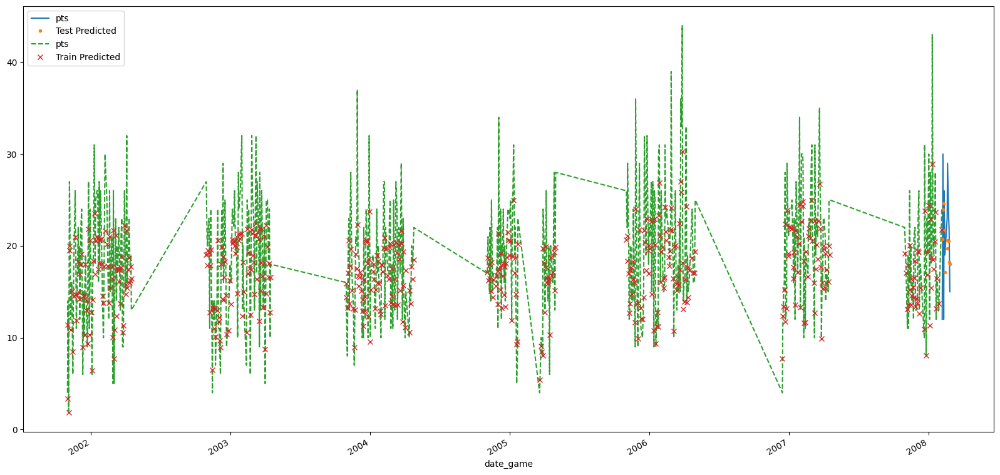

[0]	validation_0-rmse:19.44690	validation_1-rmse:17.37489
[100]	validation_0-rmse:8.77877	validation_1-rmse:8.99602
[195]	validation_0-rmse:4.93155	validation_1-rmse:8.59131


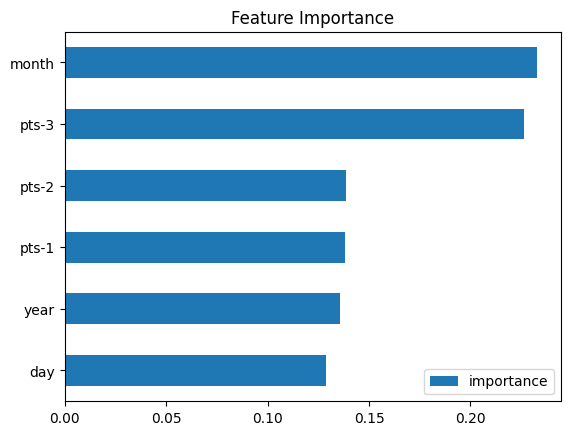

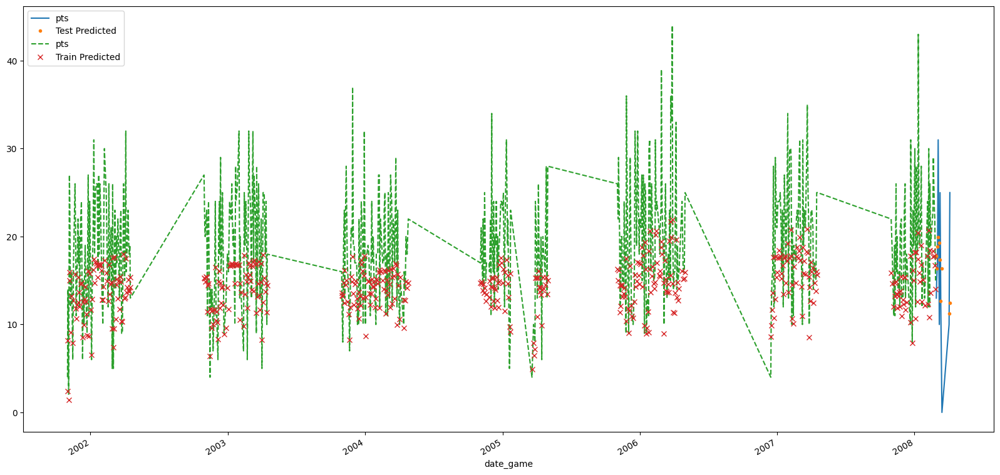

[0]	validation_0-rmse:19.40938	validation_1-rmse:20.74039
[100]	validation_0-rmse:8.77921	validation_1-rmse:11.58008
[200]	validation_0-rmse:4.86317	validation_1-rmse:9.09075
[300]	validation_0-rmse:3.09631	validation_1-rmse:8.43614
[400]	validation_0-rmse:2.20161	validation_1-rmse:8.18998
[500]	validation_0-rmse:1.70626	validation_1-rmse:8.06375
[564]	validation_0-rmse:1.43953	validation_1-rmse:8.08478


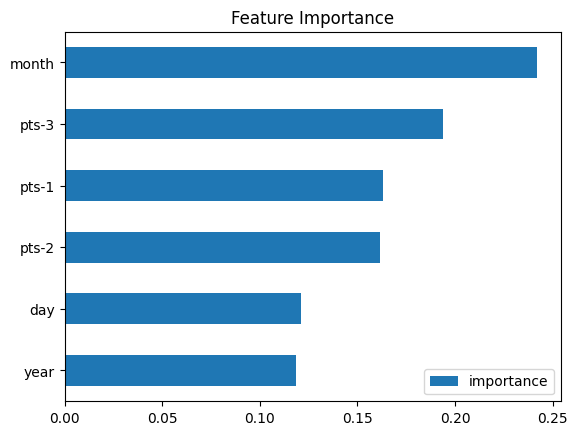

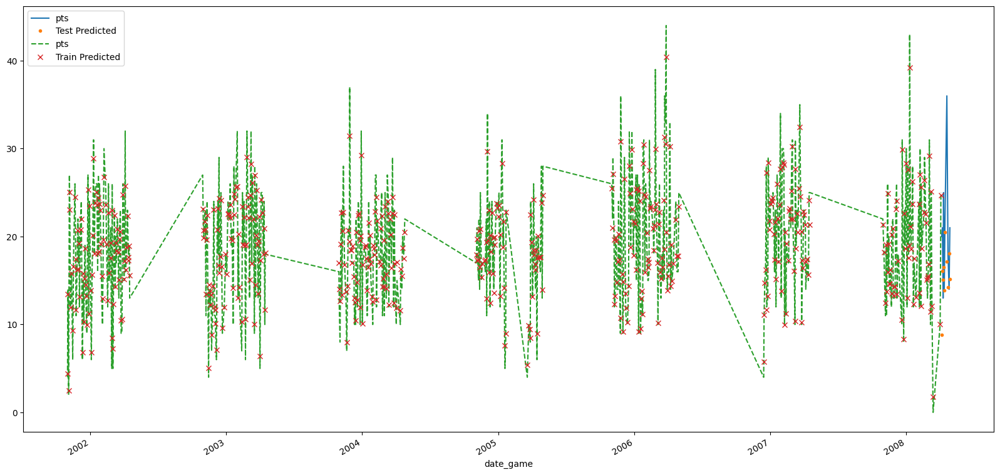

[0]	validation_0-rmse:19.43541	validation_1-rmse:16.40038
[100]	validation_0-rmse:8.86862	validation_1-rmse:5.68869
[200]	validation_0-rmse:4.65649	validation_1-rmse:4.17591
[239]	validation_0-rmse:3.84238	validation_1-rmse:4.43371


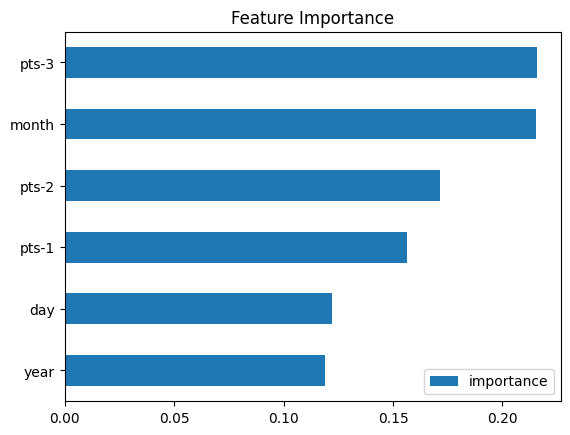

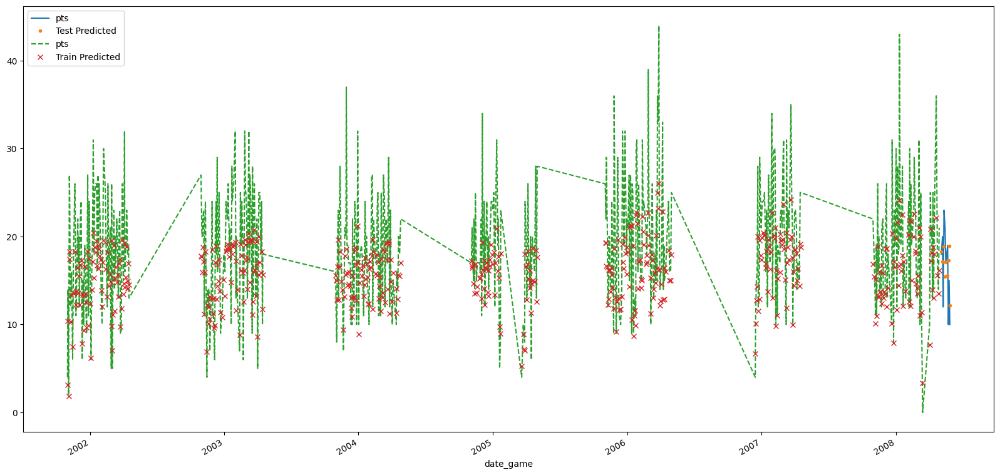

In [ ]:
pau_try_1 = pau_try_1.sort_index()

fold = 0
preds = []
scores = []

for train_idx, val_idx in tss.split(pau_try_1):
    train = pau_try_1.iloc[train_idx]
    test = pau_try_1.iloc[val_idx]

    FEATURES = ['day', 'month', 'year', 'pts-1', 'pts-2', 'pts-3']
    TARGET = 'pts'

    X_train = train[FEATURES]
    y_train = train[TARGET]

    X_test = test[FEATURES]
    y_test = test[TARGET]

    reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                           n_estimators=1000,
                           early_stopping_rounds=50,
                           objective='reg:linear',
                           max_depth=10,
                           learning_rate=0.01)
    reg.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)],
            verbose=100)
    
    plot_significance(reg)
    plot_prediction(reg, X_train, y_train, X_test, y_test, 'pts')

    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

In [ ]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Fold scores:{scores}')

Score across folds 7.4710
Fold scores:[np.float64(10.264277600063727), np.float64(6.441040652768002), np.float64(8.496733963492542), np.float64(8.058735059781094), np.float64(4.09422589618982)]


In [ ]:
pau.columns

Index(['date_game', 'mp', 'fg', 'fga', 'fg_pct', 'fg3', 'fg3a', 'fg3_pct',
       'ft', 'fta', 'ft_pct', 'orb', 'drb', 'trb', 'ast', 'stl', 'blk', 'tov',
       'pf', 'pts', 'game_score', 'plus_minus', 'season', 'player', 'day',
       'month', 'year', 'pts-1', 'pts-2', 'pts-3'],
      dtype='object')

Attempt 2:
I'm going to add three day mp lag and fga lag


In [ ]:
pau = get_time_features(pau)
pau = lag_stat(pau, 'pts', 3)
pau = lag_stat(pau, 'mp', 3)
pau = lag_stat(pau, 'fga', 3)

In [ ]:
# Getting the correct columns
pau_try_2 = pau[['date_game', 'pts', 'day', 'month', 'year', 'pts-1', 'pts-2', 'pts-3',
                 'mp-1', 'mp-2', 'mp-3', 'fga-1', 'fga-2', 'fga-3']]

pau_try_2 = pau_try_2.set_index('date_game')
pau_try_2 = pau_try_2.loc[pau_try_2.index < '05-29-2008']

In [ ]:
print(pau_try_2)

             pts  day  month  year  pts-1  pts-2  pts-3       mp-1       mp-2  \
date_game                                                                       
2001-11-01   4.0  305     11  2001    NaN    NaN    NaN        NaN        NaN   
2001-11-02  14.0  306     11  2001    4.0    NaN    NaN  17.333333        NaN   
2001-11-04   2.0  308     11  2001   14.0    4.0    NaN  23.866667  17.333333   
2001-11-06  27.0  310     11  2001    2.0   14.0    4.0  17.216667  23.866667   
2001-11-07  24.0  311     11  2001   27.0    2.0   14.0  39.533333  17.216667   
...          ...  ...    ...   ...    ...    ...    ...        ...        ...   
2008-05-16  17.0  137      5  2008   21.0   23.0   12.0  44.116667  47.583333   
2008-05-21  19.0  142      5  2008   17.0   21.0   23.0  43.683333  44.116667   
2008-05-23  10.0  144      5  2008   19.0   17.0   21.0  39.083333  43.683333   
2008-05-25  15.0  146      5  2008   10.0   19.0   17.0  29.116667  39.083333   
2008-05-27  10.0  148      5

In [15]:
tss = TimeSeriesSplit(n_splits = 5, test_size=10, gap = 0)

pau_try_2 = pau_try_2.sort_index()

fold = 0
preds = []
scores = []

for train_idx, val_idx in tss.split(pau_try_2):
    train = pau_try_2.iloc[train_idx]
    test = pau_try_2.iloc[val_idx]

    FEATURES = ['day', 'month', 'year', 'pts-1', 'pts-2', 'pts-3',
                'mp-1', 'mp-2', 'mp-3', 'fga-1', 'fga-2', 'fga-3']
    TARGET = 'pts'

    X_train = train[FEATURES]
    y_train = train[TARGET]

    X_test = test[FEATURES]
    y_test = test[TARGET]

    reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                           n_estimators=5000,
                           early_stopping_rounds=50,
                           objective='reg:squarederror',
                           max_depth=12,
                           learning_rate=0.01)
    reg.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)],
            verbose=100)
    
    plot_significance(reg)
    plot_prediction(reg, X_train, y_train,  X_test, y_test, 'pts')

    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

NameError: name 'pau_try_2' is not defined

In [ ]:
print(pau.columns)

Index(['date_game', 'mp', 'fg', 'fga', 'fg_pct', 'fg3', 'fg3a', 'fg3_pct',
       'ft', 'fta', 'ft_pct', 'orb', 'drb', 'trb', 'ast', 'stl', 'blk', 'tov',
       'pf', 'pts', 'game_score', 'plus_minus', 'season', 'player', 'day',
       'month', 'year', 'pts-1', 'pts-2', 'pts-3', 'mp-1', 'mp-2', 'mp-3',
       'fga-1', 'fga-2', 'fga-3'],
      dtype='object')


Attempt 3:
* adding fg, ft, fta lag

In [ ]:
pau = lag_stat(pau, 'fg', 3)
pau = lag_stat(pau, 'fta', 3)
pau = lag_stat(pau, 'ft', 3)

In [23]:
# Getting the correct columns
pau_try_3 = pau[['date_game', 'pts', 'day', 'month', 'year', 'pts-1', 'pts-2', 'pts-3',
                 'mp-1', 'mp-2', 'mp-3', 'fga-1', 'fga-2', 'fga-3',
                 'fg-1', 'fg-2', 'fg-3', 'ft-1', 'ft-2', 'ft-3',
                 'fta-1', 'fta-2', 'fta-3']]

pau_try_3 = pau_try_3.set_index('date_game')
pau_try_3 = pau_try_3.loc[pau_try_3.index < '05-29-2008']

NameError: name 'pau' is not defined

[0]	validation_0-rmse:19.32605	validation_1-rmse:22.92099
[100]	validation_0-rmse:8.30383	validation_1-rmse:13.40553
[200]	validation_0-rmse:3.76647	validation_1-rmse:10.63057
[300]	validation_0-rmse:1.79671	validation_1-rmse:9.33675
[400]	validation_0-rmse:0.89501	validation_1-rmse:8.84219
[459]	validation_0-rmse:0.61030	validation_1-rmse:8.83273


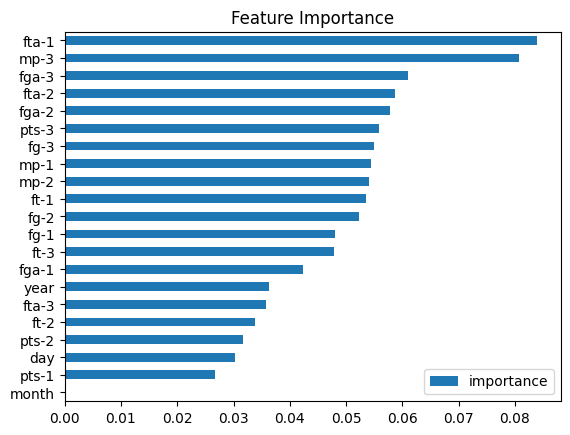

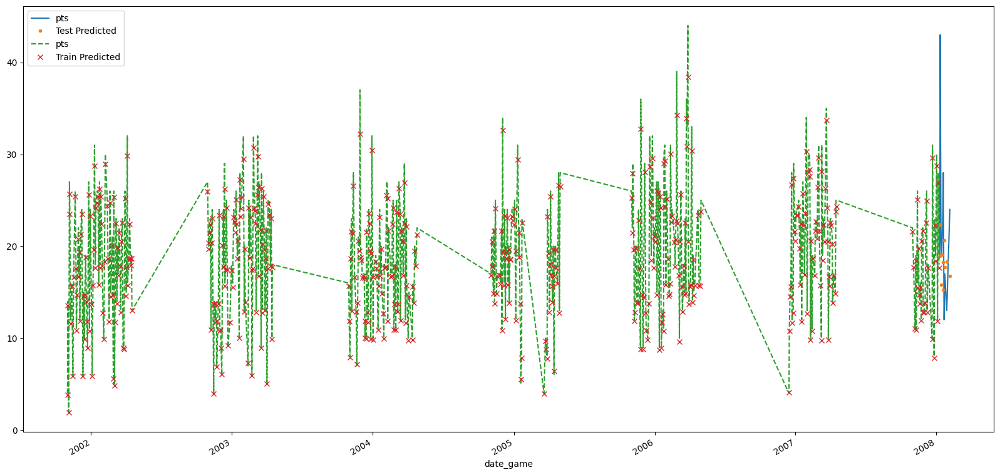

[0]	validation_0-rmse:19.40568	validation_1-rmse:21.31710
[100]	validation_0-rmse:8.35935	validation_1-rmse:10.75800
[200]	validation_0-rmse:3.76669	validation_1-rmse:8.20410
[300]	validation_0-rmse:1.76880	validation_1-rmse:7.90010
[400]	validation_0-rmse:0.87783	validation_1-rmse:7.81312
[474]	validation_0-rmse:0.54215	validation_1-rmse:7.81514


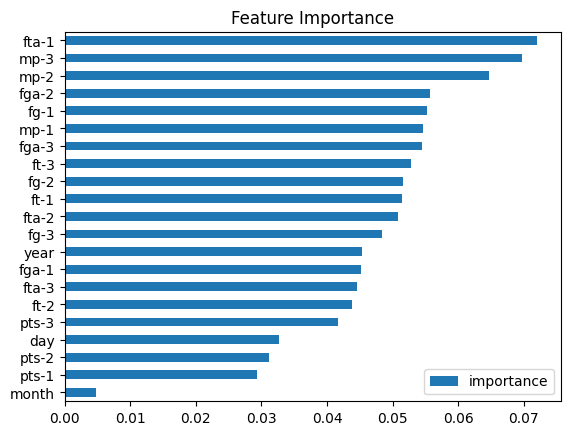

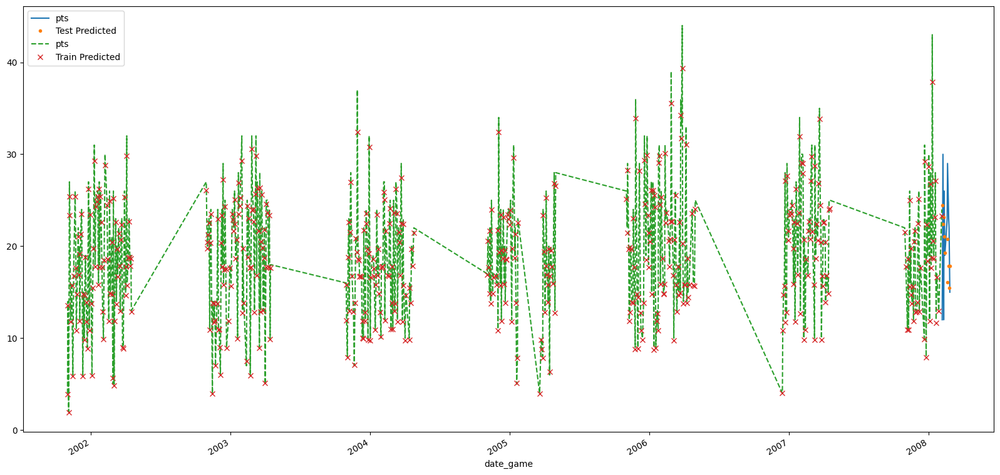

[0]	validation_0-rmse:19.44562	validation_1-rmse:17.39069
[100]	validation_0-rmse:8.35669	validation_1-rmse:9.28601
[200]	validation_0-rmse:3.76884	validation_1-rmse:8.44931
[241]	validation_0-rmse:2.76302	validation_1-rmse:8.50857


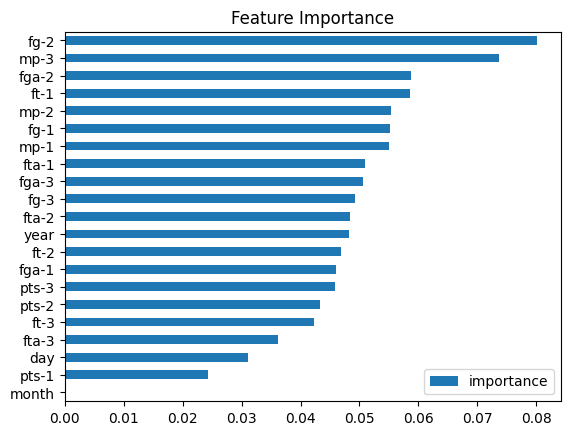

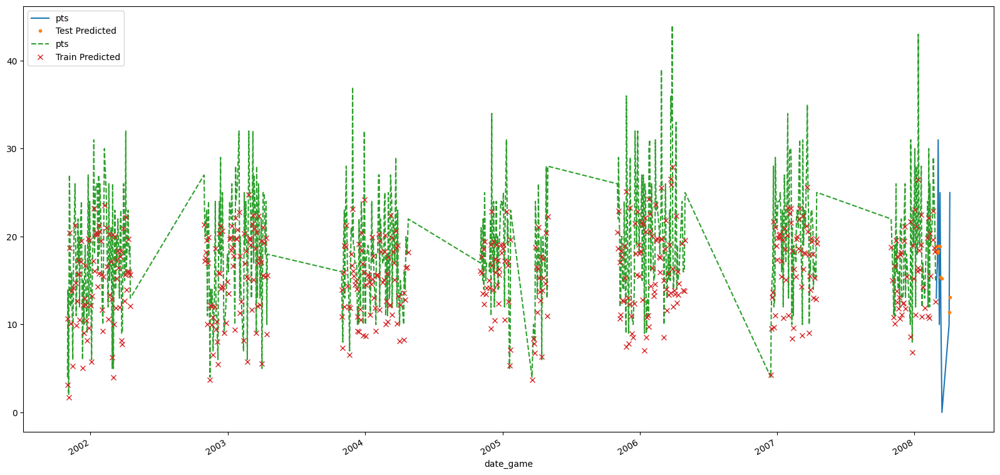

[0]	validation_0-rmse:19.40807	validation_1-rmse:20.73701
[100]	validation_0-rmse:8.36518	validation_1-rmse:11.91091
[200]	validation_0-rmse:3.79274	validation_1-rmse:9.48037
[300]	validation_0-rmse:1.80864	validation_1-rmse:8.85022
[400]	validation_0-rmse:0.90320	validation_1-rmse:8.53147
[500]	validation_0-rmse:0.47219	validation_1-rmse:8.33178
[600]	validation_0-rmse:0.26085	validation_1-rmse:8.19071
[700]	validation_0-rmse:0.14485	validation_1-rmse:8.17029
[800]	validation_0-rmse:0.08431	validation_1-rmse:8.16284
[900]	validation_0-rmse:0.04999	validation_1-rmse:8.15848
[1000]	validation_0-rmse:0.03030	validation_1-rmse:8.15753
[1100]	validation_0-rmse:0.01867	validation_1-rmse:8.15631
[1200]	validation_0-rmse:0.01143	validation_1-rmse:8.15469
[1300]	validation_0-rmse:0.00693	validation_1-rmse:8.15389
[1400]	validation_0-rmse:0.00425	validation_1-rmse:8.15352
[1500]	validation_0-rmse:0.00266	validation_1-rmse:8.15324
[1600]	validation_0-rmse:0.00167	validation_1-rmse:8.15306
[1700]

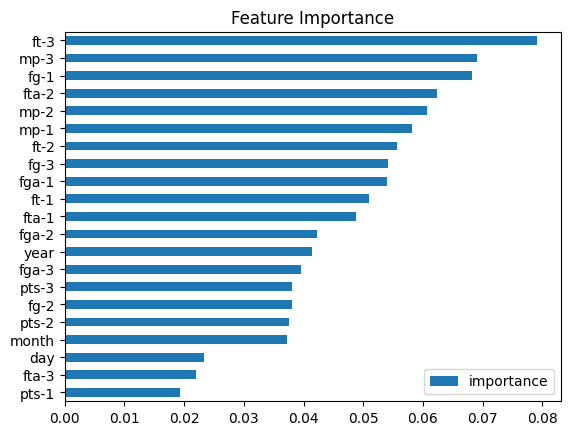

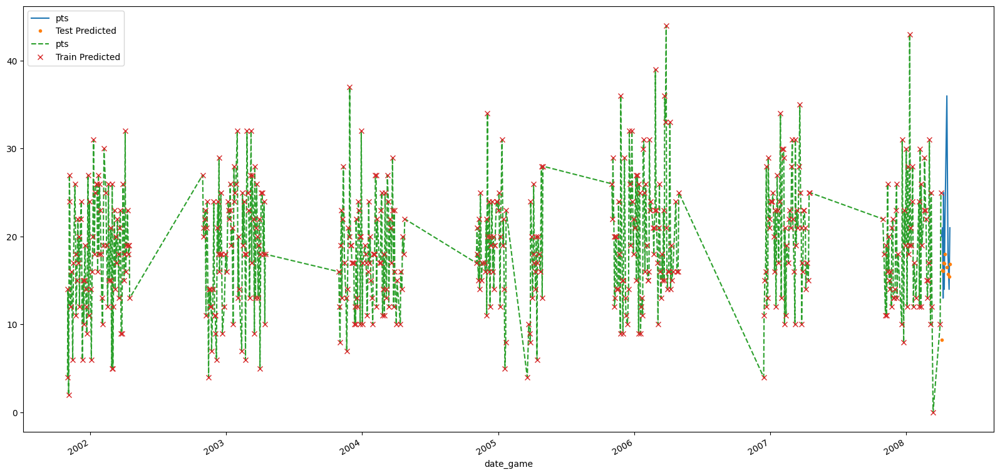

[0]	validation_0-rmse:19.43409	validation_1-rmse:16.39660
[100]	validation_0-rmse:8.39368	validation_1-rmse:6.68008
[200]	validation_0-rmse:3.82026	validation_1-rmse:4.82042
[300]	validation_0-rmse:1.82606	validation_1-rmse:4.63835
[349]	validation_0-rmse:1.30000	validation_1-rmse:4.73490


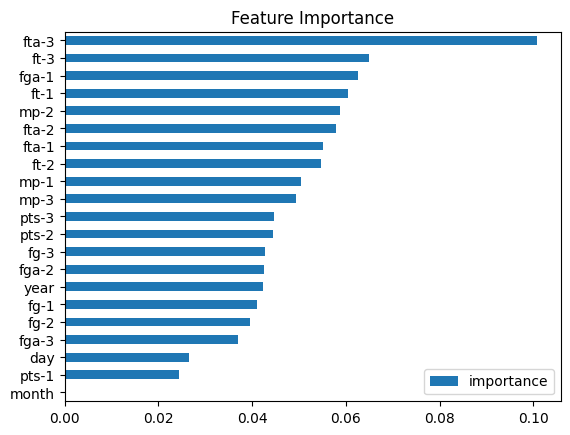

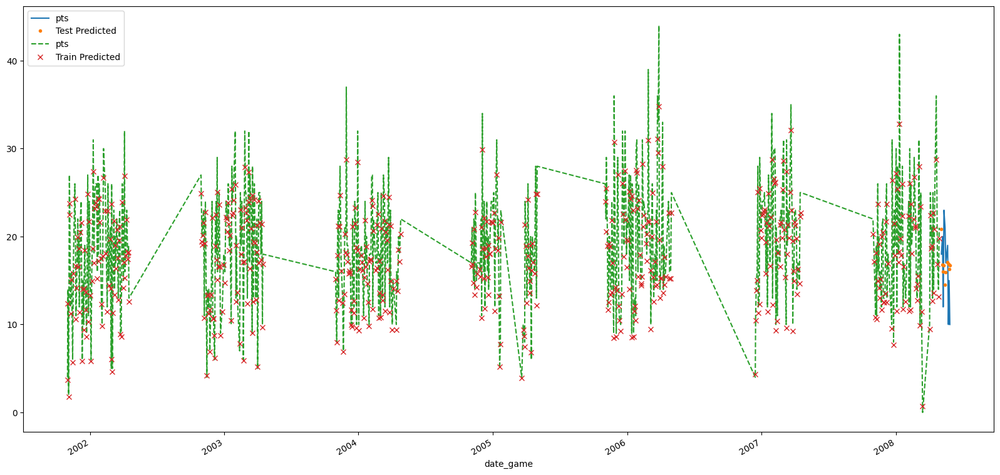

In [ ]:
tss = TimeSeriesSplit(n_splits = 5, test_size=10, gap = 0)

pau_try_3 = pau_try_3.sort_index()

fold = 0
preds = []
scores = []

for train_idx, val_idx in tss.split(pau_try_3):
    train = pau_try_3.iloc[train_idx]
    test = pau_try_3.iloc[val_idx]

    FEATURES = ['day', 'month', 'year', 'pts-1', 'pts-2', 'pts-3',
                'mp-1', 'mp-2', 'mp-3', 'fga-1', 'fga-2', 'fga-3',
                'fg-1', 'fg-2', 'fg-3', 'ft-1', 'ft-2', 'ft-3',
                'fta-1', 'fta-2', 'fta-3']
    TARGET = 'pts'

    X_train = train[FEATURES]
    y_train = train[TARGET]

    X_test = test[FEATURES]
    y_test = test[TARGET]

    reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                           n_estimators=5000,
                           early_stopping_rounds=50,
                           objective='reg:linear',
                           max_depth=15,
                           learning_rate=0.01)
    reg.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)],
            verbose=100)
    
    plot_significance(reg)
    plot_prediction(reg, X_train, y_train,  X_test, y_test, 'pts')

    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

## Perhaps I lag everything

In [10]:
def lag_all_stats(name, num_lag):
    df = extract_df(name, sort_by_date=True)

    columns = [col for col in df.columns.to_list() if col not in ["date_game","fg_pct", "ft_pct", "fg3_pct", "season", "player"]]

    for column in columns:
        df = lag_stat(df, column, num_lag)

    df = get_time_features(df)

    return df

# Selects relevant columns (X, y)
def select_columns(df, stat):
    df = df.copy()
    df = df.set_index('date_game')

    substrings = ["-", "day", "month", "year", stat]
    X = df.loc[:, df.columns.str.contains('|'.join(substrings))]

    return X
 

In [ ]:
pau_all = lag_all_stats("Pau Gasol", 3)

In [ ]:
pau_all = select_columns(pau_all, 'pts')

[0]	validation_0-rmse:18.04857	validation_1-rmse:11.56856
[100]	validation_0-rmse:7.57454	validation_1-rmse:6.36027
[200]	validation_0-rmse:3.31777	validation_1-rmse:5.10575
[300]	validation_0-rmse:1.51838	validation_1-rmse:4.94509
[307]	validation_0-rmse:1.44035	validation_1-rmse:4.95699


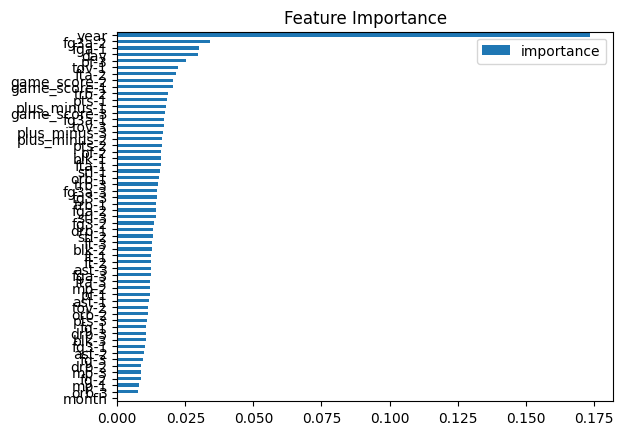

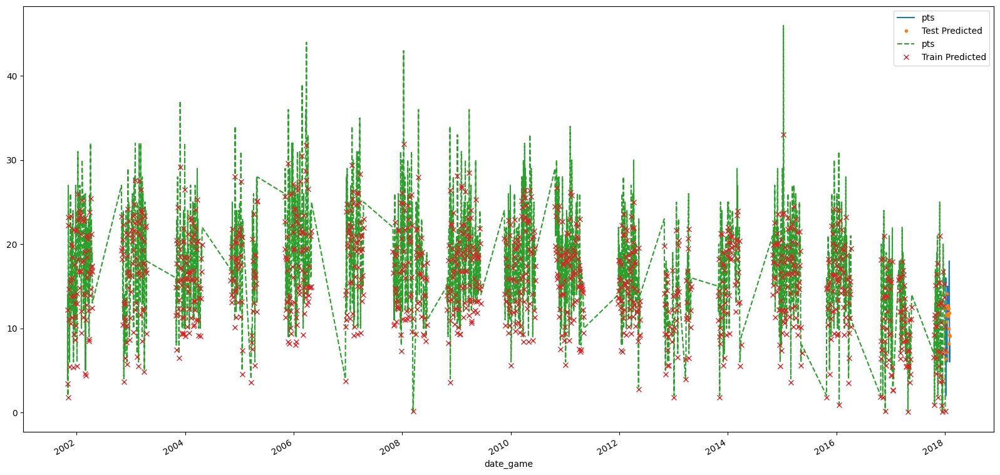

[0]	validation_0-rmse:17.98727	validation_1-rmse:9.51856
[100]	validation_0-rmse:7.55023	validation_1-rmse:5.05822
[200]	validation_0-rmse:3.30822	validation_1-rmse:4.69124
[284]	validation_0-rmse:1.70251	validation_1-rmse:4.74458


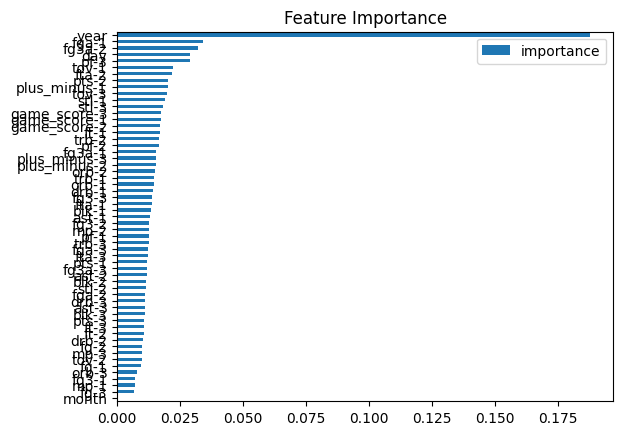

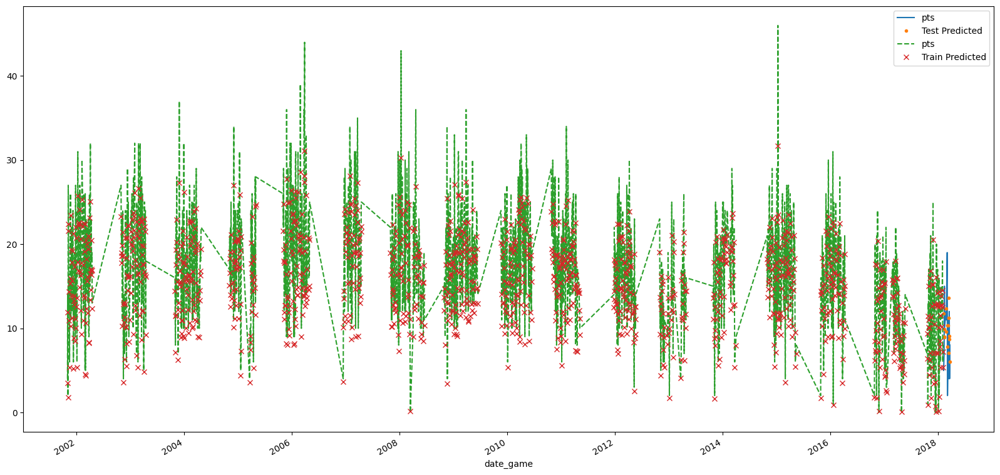

[0]	validation_0-rmse:17.91412	validation_1-rmse:8.33903
[100]	validation_0-rmse:7.51124	validation_1-rmse:6.31558
[194]	validation_0-rmse:3.46578	validation_1-rmse:6.07121


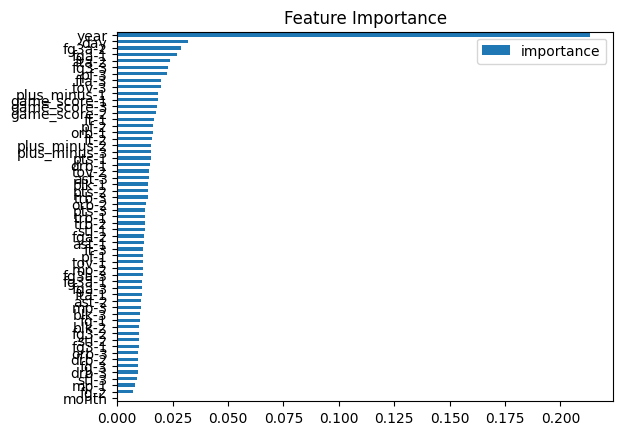

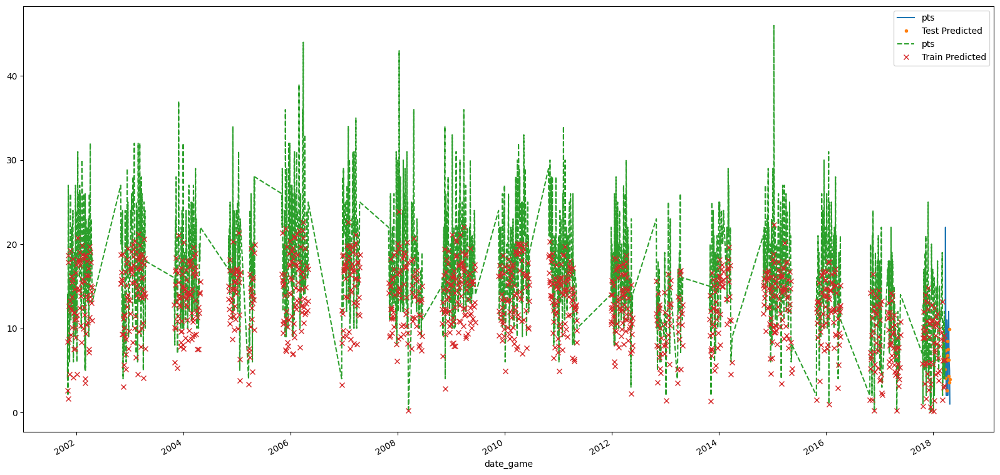

[0]	validation_0-rmse:17.83483	validation_1-rmse:5.97303
[100]	validation_0-rmse:7.49259	validation_1-rmse:3.97240
[126]	validation_0-rmse:6.02311	validation_1-rmse:4.11050


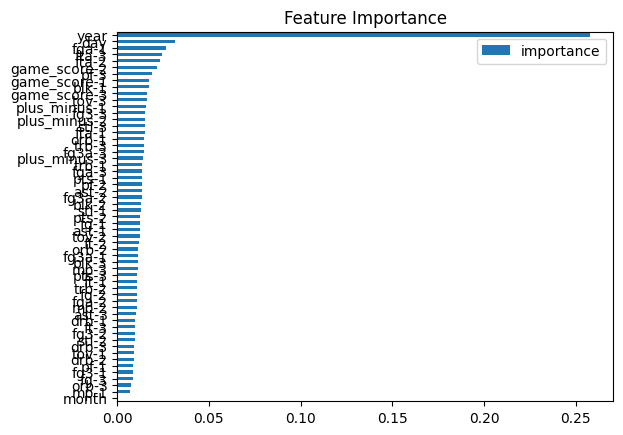

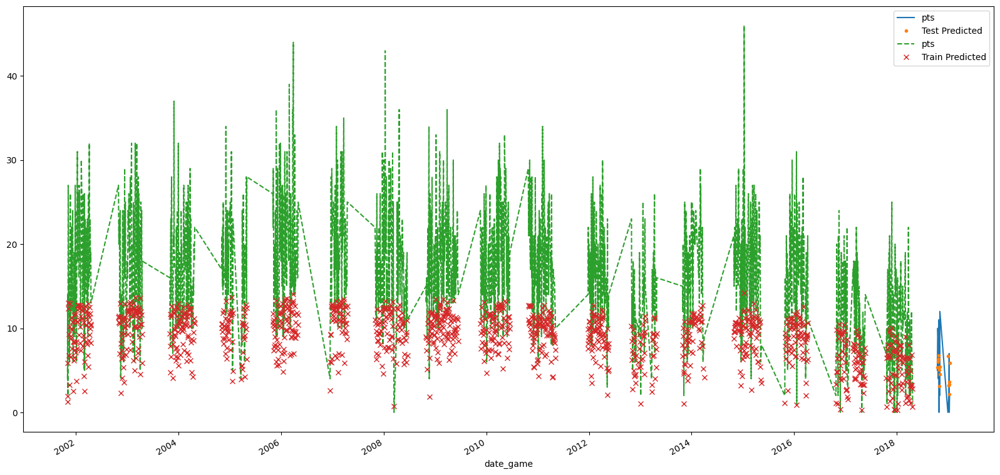

[0]	validation_0-rmse:17.74648	validation_1-rmse:4.05336
[100]	validation_0-rmse:7.48154	validation_1-rmse:3.28187
[129]	validation_0-rmse:5.86891	validation_1-rmse:3.36077


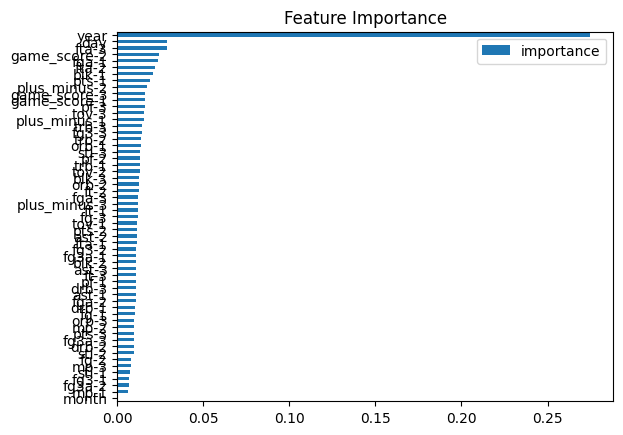

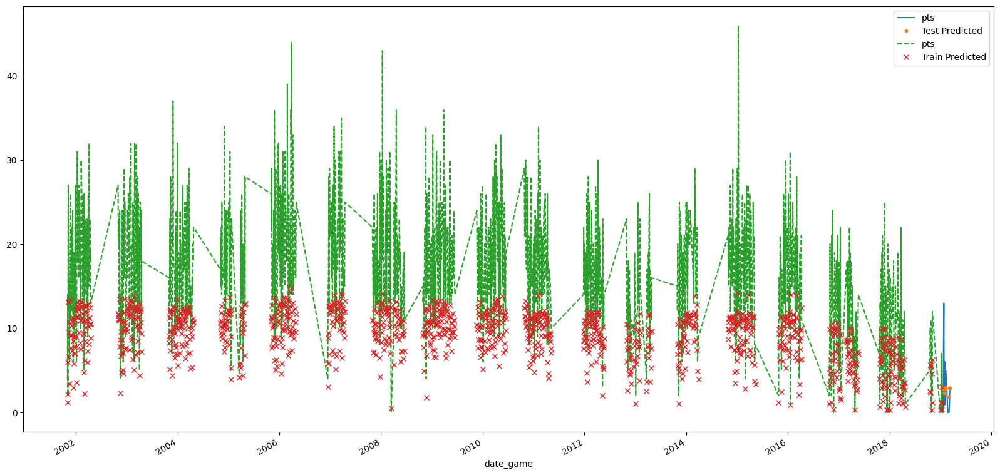

In [ ]:
tss = TimeSeriesSplit(n_splits = 5, test_size=15, gap = 0)

pau_all = pau_all.sort_index()

fold = 0
preds = []
scores = []

for train_idx, val_idx in tss.split(pau_all):
    train = pau_all.iloc[train_idx]
    test = pau_all.iloc[val_idx]

    FEATURES = [col for col in pau_all.columns if col != "pts"]
    TARGET = 'pts'

    X_train = train[FEATURES]
    y_train = train[TARGET]

    X_test = test[FEATURES]
    y_test = test[TARGET]

    reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                           n_estimators=5000,
                           early_stopping_rounds=50,
                           objective='reg:linear',
                           max_depth=20,
                           learning_rate=0.01)
    reg.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)],
            verbose=100)
    
    plot_significance(reg)
    plot_prediction(reg, X_train, y_train,  X_test, y_test, 'pts')

    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

In [52]:
def create_ts_model(player_name:str, lag_count:int, y_stat:str, date:str,
                    n_splits:int, test_size:int, gap = 0,
                    n_estimators=5000,
                    early_stopping_rounds=50,
                    max_depth=20,
                    learning_rate=0.01, 
                    verbose = 100, visualize = False, plot_last_n = "All", plt_title: str = ""):
    
    # Lagging all relevant stats
    df = lag_all_stats(player_name, lag_count)
    # Selecting the right columns for training and testing
    df = select_columns(df, y_stat)

    # Only keep data until the date
    df = df.loc[df.index < date]

    tss = TimeSeriesSplit(n_splits = n_splits, test_size=test_size, gap = gap)

    df = df.sort_index()

    fold = 0
    preds = []
    scores = []

    FEATURES = [col for col in df.columns if col != y_stat]
    TARGET = y_stat

    for train_idx, val_idx in tss.split(df):
        train = df.iloc[train_idx]
        test = df.iloc[val_idx]

        

        X_train = train[FEATURES]
        y_train = train[TARGET]

        X_test = test[FEATURES]
        y_test = test[TARGET]

        reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                            n_estimators=n_estimators,
                            early_stopping_rounds=early_stopping_rounds,
                            objective='reg:squarederror',
                            max_depth=max_depth,
                            learning_rate=learning_rate)
        reg.fit(X_train, y_train,
                eval_set=[(X_train, y_train), (X_test, y_test)],
                verbose=verbose)
        
        if(visualize):
            plot_significance(reg)
            plot_prediction(reg, X_train, y_train,  X_test, y_test, y_stat, plot_last_n, plt_title)

        y_pred = reg.predict(X_test)
        preds.append(y_pred)
        score = np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_pred))
        scores.append(score)

    return reg, preds, scores

[0]	validation_0-rmse:19.38416	validation_1-rmse:17.95031
[100]	validation_0-rmse:8.04719	validation_1-rmse:6.79672
[200]	validation_0-rmse:3.48410	validation_1-rmse:4.75037
[257]	validation_0-rmse:2.20979	validation_1-rmse:4.82548


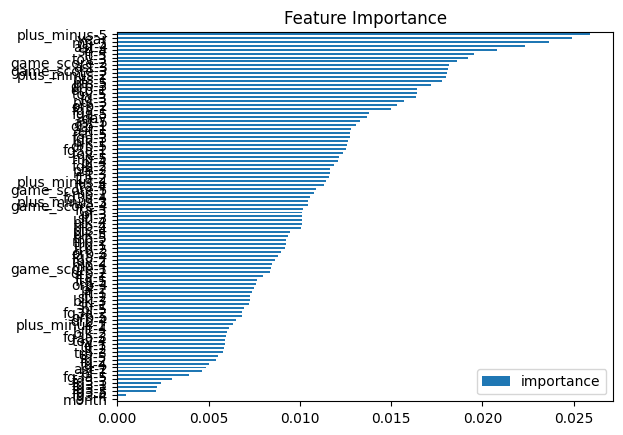

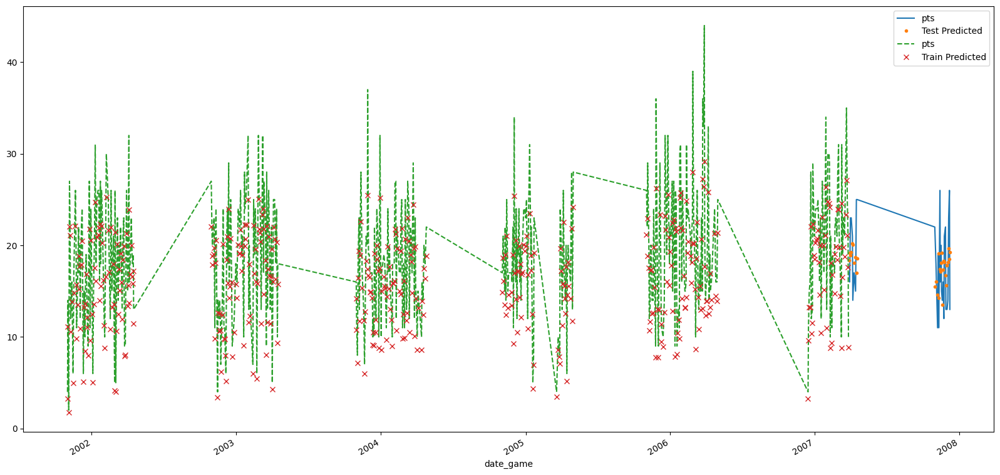

[0]	validation_0-rmse:19.29679	validation_1-rmse:21.64146
[100]	validation_0-rmse:8.01232	validation_1-rmse:12.75534
[200]	validation_0-rmse:3.49412	validation_1-rmse:9.89284
[300]	validation_0-rmse:1.61312	validation_1-rmse:9.03190
[400]	validation_0-rmse:0.77962	validation_1-rmse:8.72017
[500]	validation_0-rmse:0.39815	validation_1-rmse:8.62910
[600]	validation_0-rmse:0.21583	validation_1-rmse:8.58684
[700]	validation_0-rmse:0.12266	validation_1-rmse:8.57623
[719]	validation_0-rmse:0.11038	validation_1-rmse:8.57734


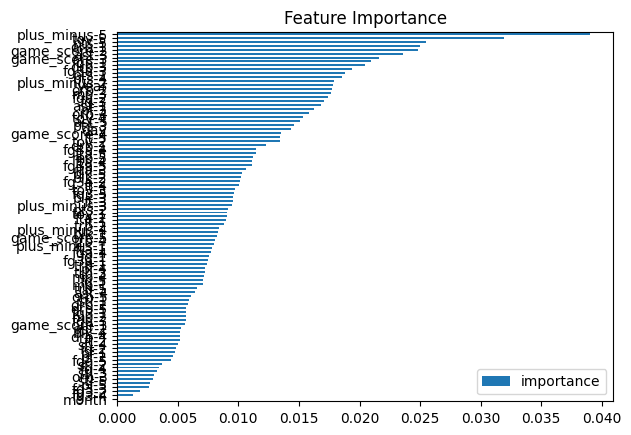

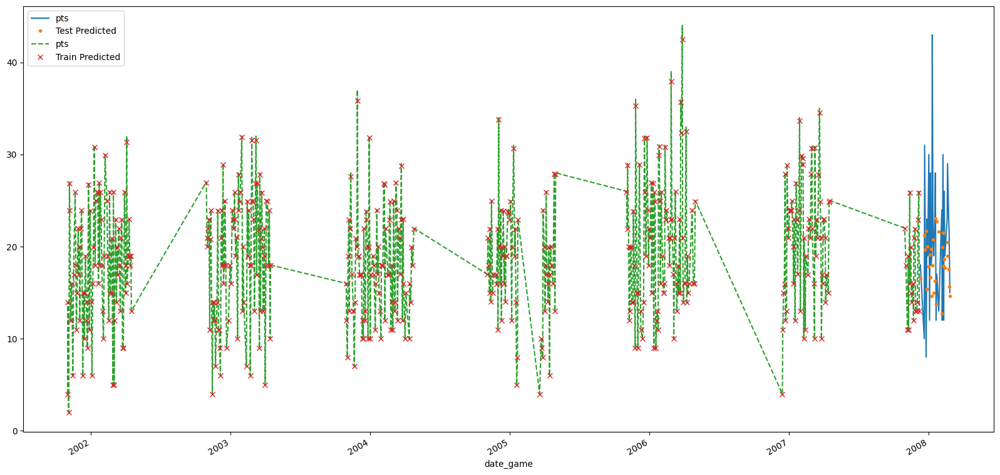

[0]	validation_0-rmse:19.44405	validation_1-rmse:18.27037
[100]	validation_0-rmse:8.09577	validation_1-rmse:9.30366
[200]	validation_0-rmse:3.52266	validation_1-rmse:7.16436
[300]	validation_0-rmse:1.60667	validation_1-rmse:6.78778
[393]	validation_0-rmse:0.81047	validation_1-rmse:6.80266


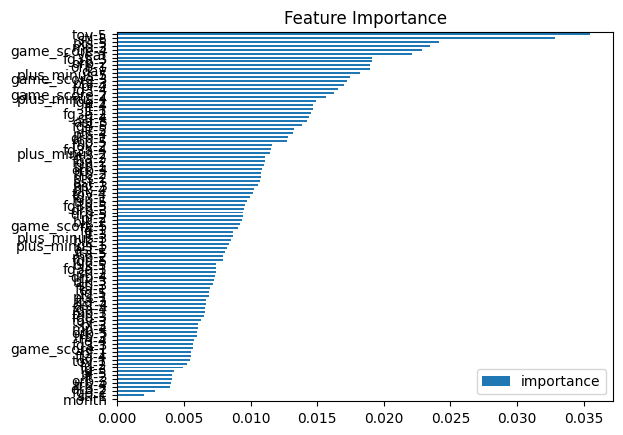

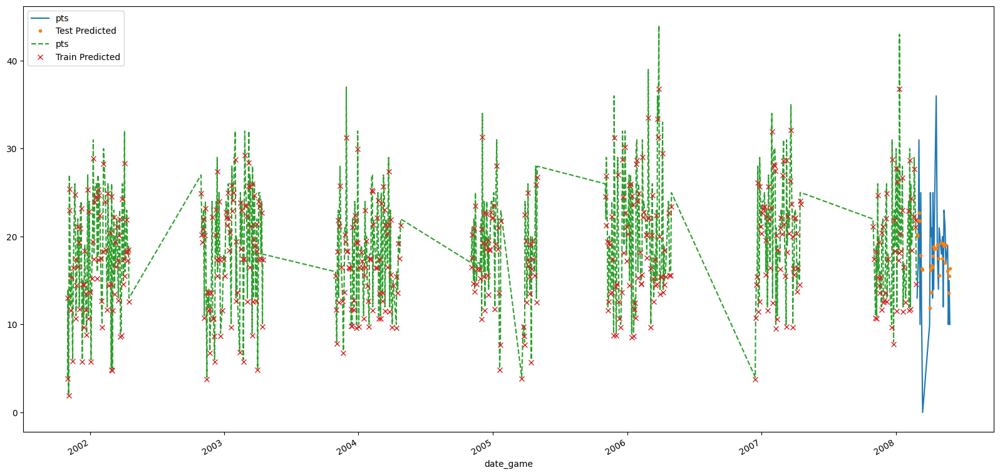

In [ ]:
gasol_pts_reg, gasol_pts_preds, gasol_pts_scores = create_ts_model("Pau Gasol",5, "pts", '05-29-2008', 3, 30)

In [ ]:
print(f"Average RMSE Across Folds {np.mean(gasol_pts_scores)}")
print(f"Predicted Scores: {gasol_pts_preds}")

Average RMSE Across Folds 6.702753175978078
Predicted Scores: [array([18.348923 , 19.190758 , 18.892368 , 19.218718 , 20.18449  ,
       20.075615 , 18.06761  , 18.679338 , 16.977192 , 18.59374  ,
       15.462326 , 16.010492 , 14.601339 , 14.289833 , 19.112654 ,
       17.4212   , 17.10637  , 18.073269 , 19.198156 , 13.4752245,
       17.33727  , 18.324928 , 18.164959 , 16.714779 , 15.615759 ,
       17.841612 , 18.12712  , 19.678354 , 18.524767 , 19.222834 ],
      dtype=float32), array([16.53088 , 21.228718, 19.639618, 21.710657, 15.367425, 19.97732 ,
       17.808857, 19.126078, 16.654715, 19.741827, 14.61355 , 17.965117,
       20.770369, 14.960973, 16.27129 , 23.036373, 13.731394, 22.743486,
       21.634106, 12.702936, 19.965664, 21.469793, 17.878942, 18.625542,
       17.69621 , 18.950546, 20.496983, 17.581934, 15.653228, 14.655294],
      dtype=float32), array([20.096008, 20.18238 , 21.858053, 22.677544, 21.75703 , 17.879084,
       16.339842, 16.201162, 11.878988, 16.197062, 

In [39]:
gasol_trb_reg, gasol_trb_preds, gasol_trb_scores = create_ts_model("Pau Gasol", 3, "trb", '05-29-2008', 3, 30)

[0]	validation_0-rmse:8.71555	validation_1-rmse:8.57275
[100]	validation_0-rmse:3.69759	validation_1-rmse:4.58828
[200]	validation_0-rmse:1.63985	validation_1-rmse:4.18903
[293]	validation_0-rmse:0.79798	validation_1-rmse:4.17835
[0]	validation_0-rmse:8.70737	validation_1-rmse:8.97703
[100]	validation_0-rmse:3.68062	validation_1-rmse:4.97965
[200]	validation_0-rmse:1.62405	validation_1-rmse:4.11579
[300]	validation_0-rmse:0.73754	validation_1-rmse:3.80854
[376]	validation_0-rmse:0.41644	validation_1-rmse:3.80443
[0]	validation_0-rmse:8.72337	validation_1-rmse:8.33650
[100]	validation_0-rmse:3.69169	validation_1-rmse:4.75961
[200]	validation_0-rmse:1.62895	validation_1-rmse:3.89845
[300]	validation_0-rmse:0.75320	validation_1-rmse:3.67557
[400]	validation_0-rmse:0.36808	validation_1-rmse:3.63642
[494]	validation_0-rmse:0.19790	validation_1-rmse:3.63816


In [ ]:
print(f"Average RMSE Across Folds {np.mean(gasol_trb_scores)}")
print(f"Predicted Scores: {gasol_trb_preds}")

Average RMSE Across Folds 3.8063824634474095
Predicted Scores: [array([10.774627 ,  7.270041 ,  7.9167356,  9.599354 ,  9.98728  ,
       11.430188 ,  9.880717 , 11.318698 , 10.543771 ,  8.569272 ,
        8.121619 ,  7.2196674,  8.72293  ,  9.6167965, 10.402968 ,
        8.153382 ,  6.904062 ,  4.6437216,  7.003701 ,  9.596148 ,
        5.978233 ,  7.0737443,  4.7351823,  6.3120756,  8.486724 ,
        9.367584 ,  4.535867 ,  6.5456715, 11.740594 ,  6.053615 ],
      dtype=float32), array([ 9.161447 ,  9.649333 ,  9.792812 ,  9.191949 ,  7.6158834,
       10.55104  , 10.696553 ,  7.7944417,  7.7897367,  6.971664 ,
        9.564407 ,  8.674244 ,  6.779487 ,  8.302466 ,  7.540181 ,
       10.105166 ,  9.353633 ,  8.051151 ,  9.840062 ,  7.3668985,
        9.762476 ,  8.106914 ,  7.4863553,  7.2954025,  6.9354134,
       10.797753 ,  7.568739 ,  8.105166 ,  6.0375547,  6.7319403],
      dtype=float32), array([ 5.7790313,  4.8878126, 10.050809 ,  7.60507  ,  7.12888  ,
        7.398118 , 

[0]	validation_0-rmse:3.24293	validation_1-rmse:3.43805
[100]	validation_0-rmse:1.42170	validation_1-rmse:2.54639
[200]	validation_0-rmse:0.65570	validation_1-rmse:2.35261
[300]	validation_0-rmse:0.32123	validation_1-rmse:2.24976
[353]	validation_0-rmse:0.22225	validation_1-rmse:2.25936


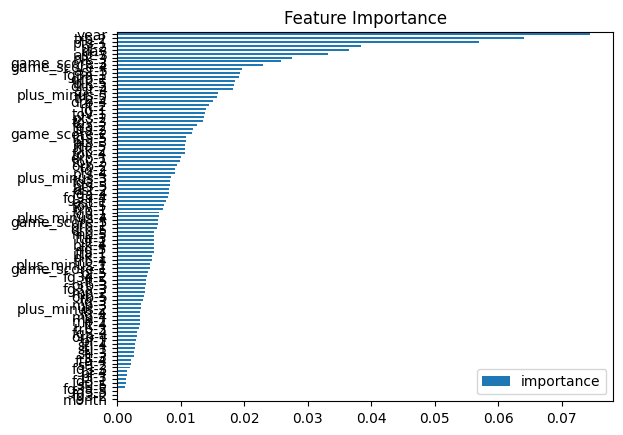

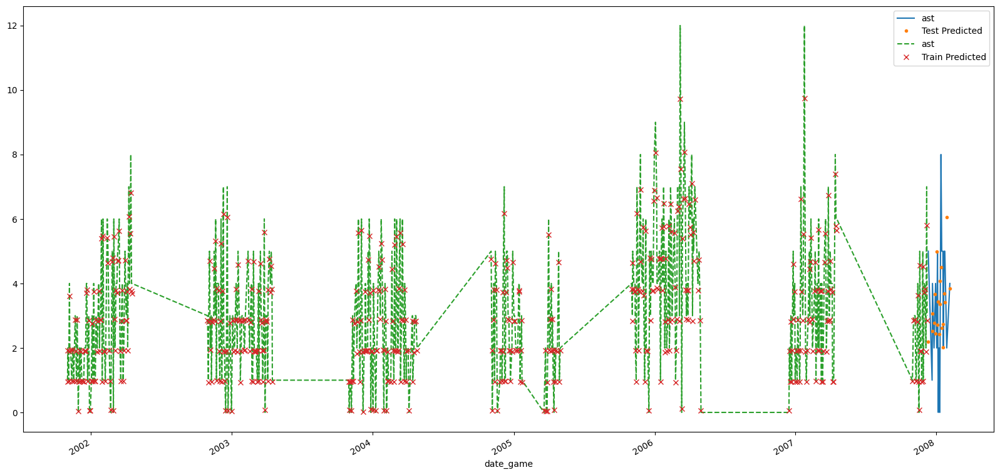

[0]	validation_0-rmse:3.25060	validation_1-rmse:4.02801
[100]	validation_0-rmse:1.42320	validation_1-rmse:2.80804
[192]	validation_0-rmse:0.69461	validation_1-rmse:2.74803


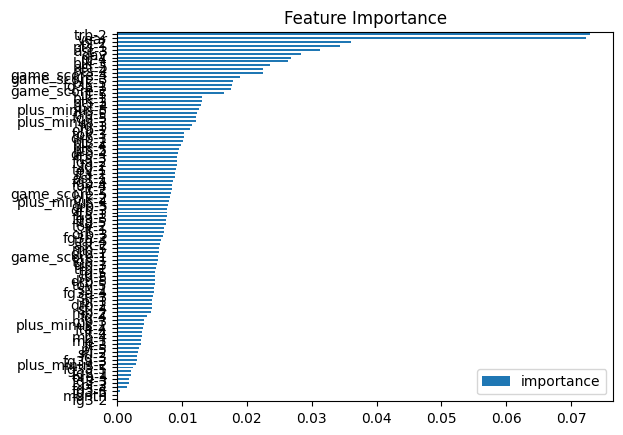

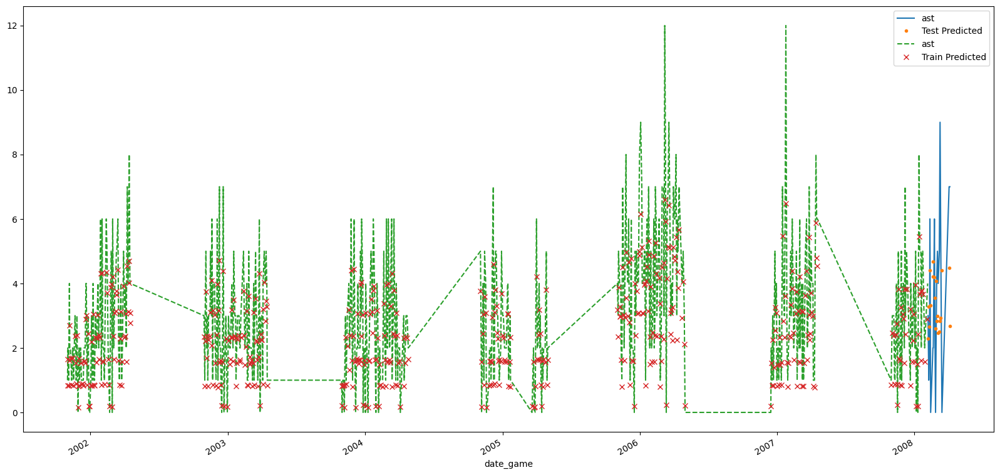

[0]	validation_0-rmse:3.28453	validation_1-rmse:3.76148
[100]	validation_0-rmse:1.43982	validation_1-rmse:2.73055
[200]	validation_0-rmse:0.66048	validation_1-rmse:2.48141
[300]	validation_0-rmse:0.31846	validation_1-rmse:2.40014
[352]	validation_0-rmse:0.22512	validation_1-rmse:2.39956


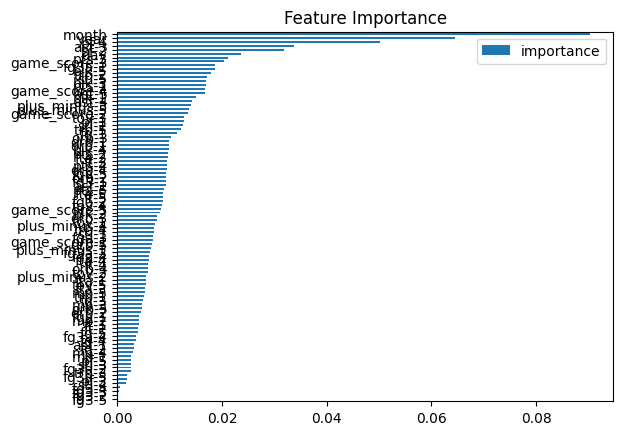

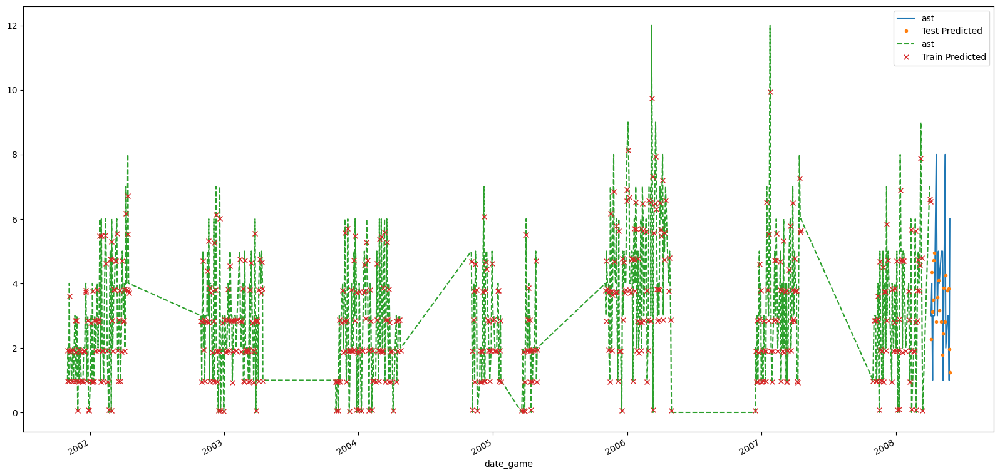

In [ ]:
gasol_ast_reg, gasol_ast_preds, gasol_ast_scores = create_ts_model("Pau Gasol",5, "ast", '05-29-2008', 3, 20)

In [12]:
def get_diddy_dates(name: str):
    df = pd.read_csv("./Diddy-Stats/diddygames.csv")

    return sorted(df.loc[df["player"] == name, "date"].to_list())


In [53]:
def predict_per_date(name: str, lag_count:int, y_stat:str,
                    n_splits:int, test_size:int, gap:int = 0,
                    n_estimators:int =5000,
                    early_stopping_rounds:int =50,
                    max_depth:int =20,
                    learning_rate:int =0.01, 
                    verbose = 100, visualize: bool = False, 
                    plot_last_n = "All", plt_title=""):
    """
    Predicts a stat for each Diddy Game, given a player and model parameters
    """
    dates = get_diddy_dates(name) 
    predictions = []
    real = []

    df = lag_all_stats(name, lag_count)
        
    FEATURES = [col for col in df.columns if "-" in str(col) or str(col) in ["year", "month", "day"]]
    TARGET = y_stat

    for date in dates:
        print(date)
        reg, preds, scores = create_ts_model(name, lag_count, y_stat, date,
                                            n_splits, test_size, gap, n_estimators,
                                            early_stopping_rounds, max_depth, 
                                            learning_rate, verbose, visualize, plot_last_n, plt_title)
        
        print(f'Score across folds {np.mean(scores):0.4f}')
        print(f'Fold scores:{scores}')
        
        game_to_predict = df.loc[df["date_game"] == date, FEATURES]

        predictions.append(reg.predict(game_to_predict)[0])
        real.append(df.loc[df["date_game"] == date, TARGET])
    
    return predictions, real

# Pau Gasol Official Results

2008-05-29


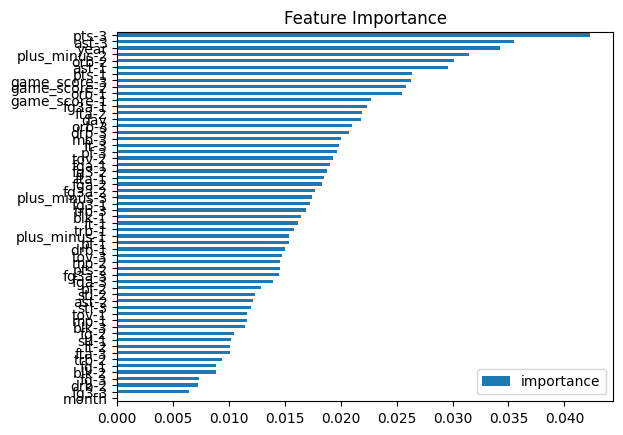

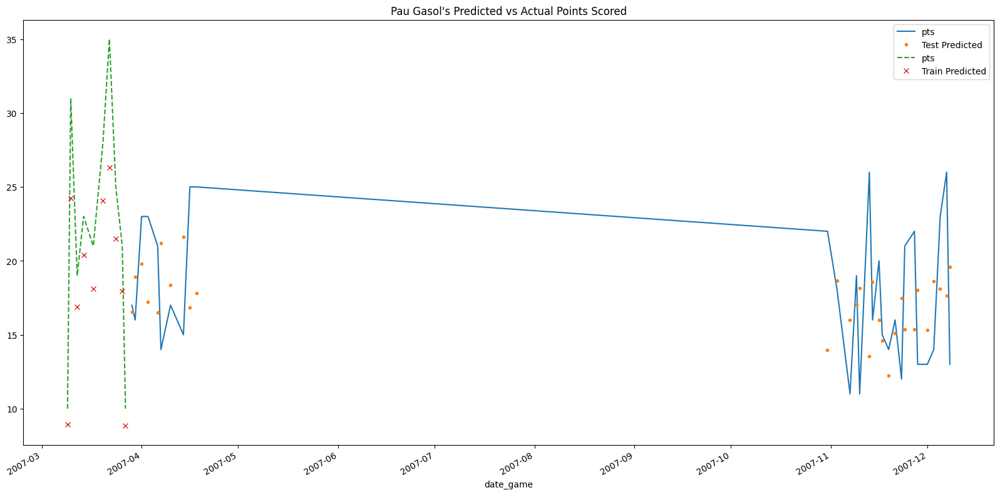

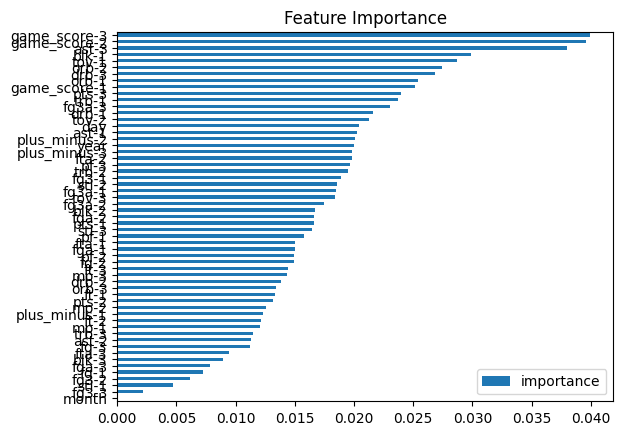

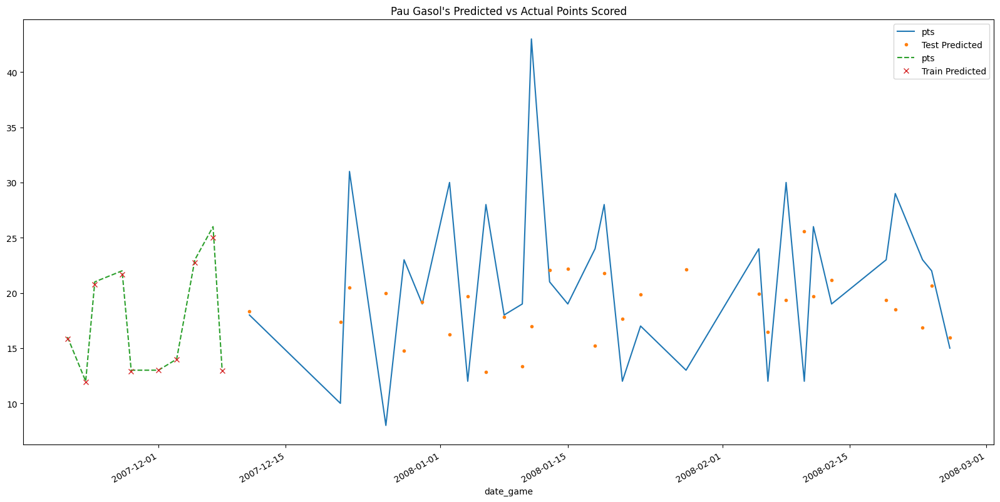

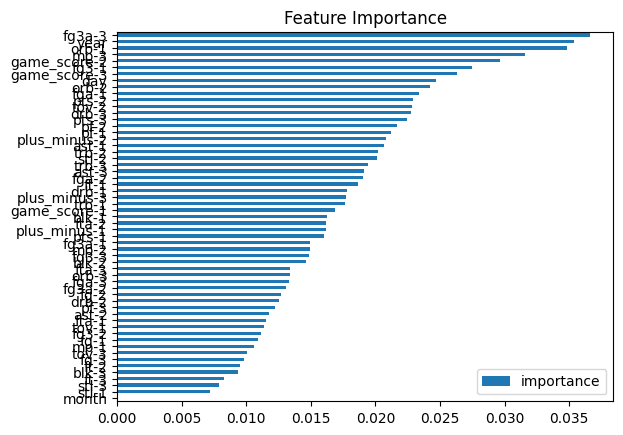

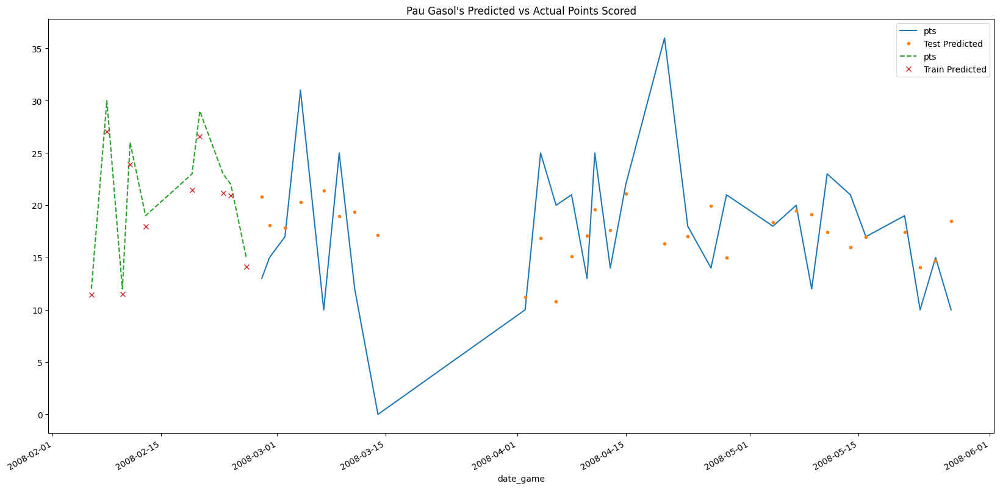

Score across folds 7.2269
Fold scores:[np.float64(5.505401052892263), np.float64(8.860072516421415), np.float64(7.3153004204139895)]
2008-06-15


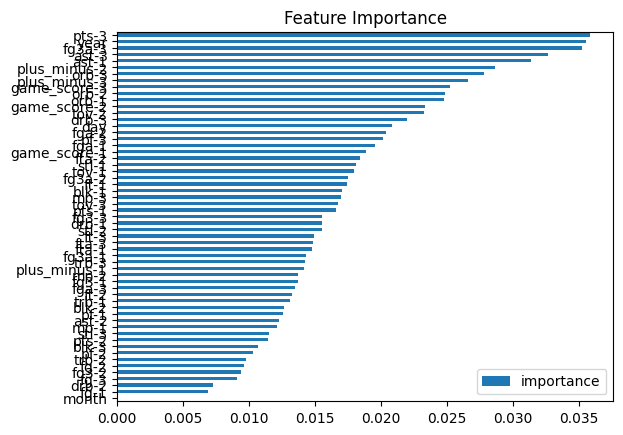

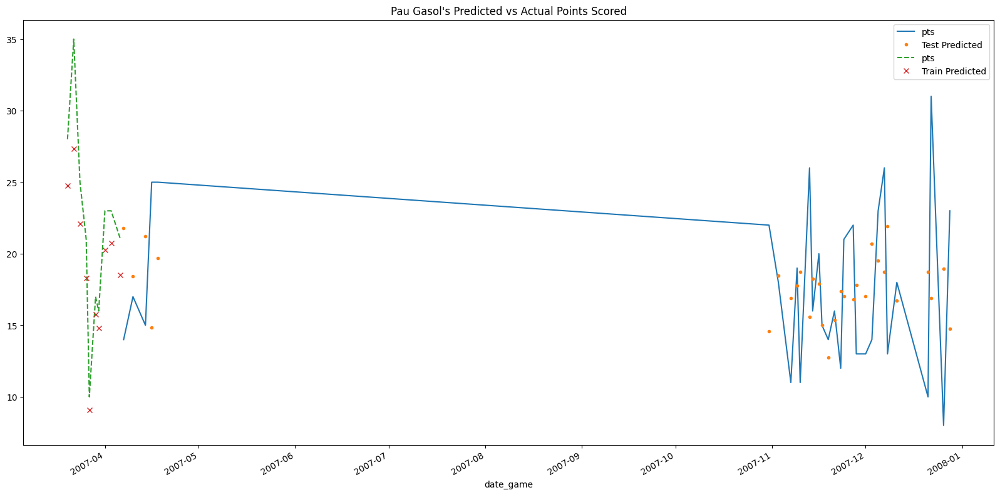

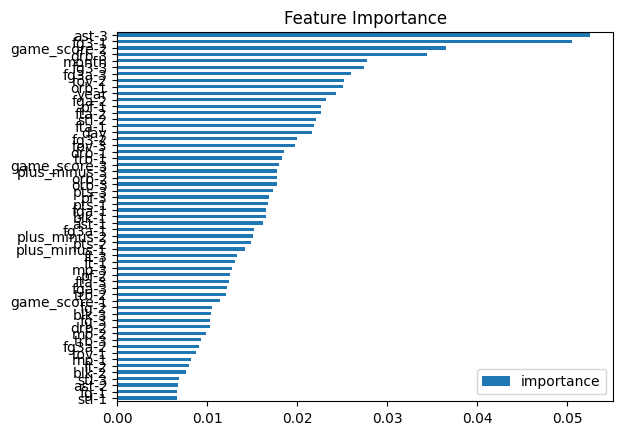

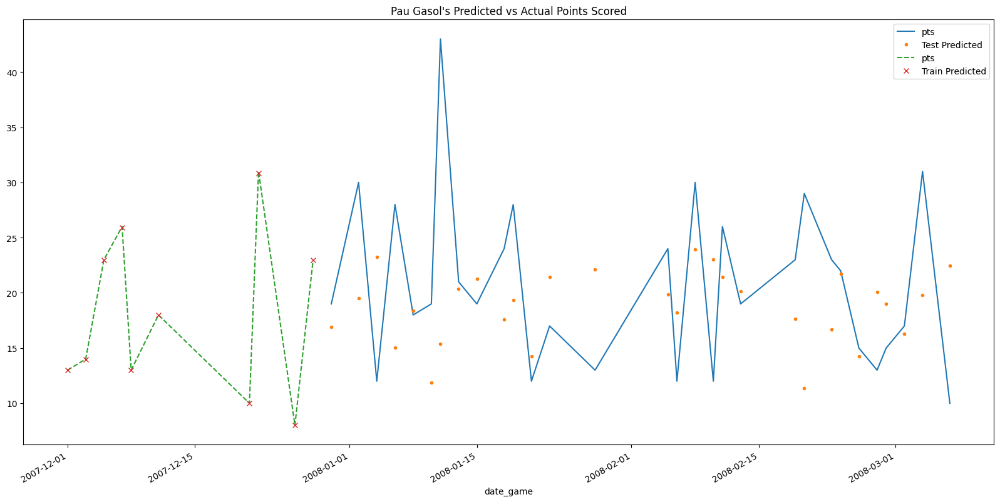

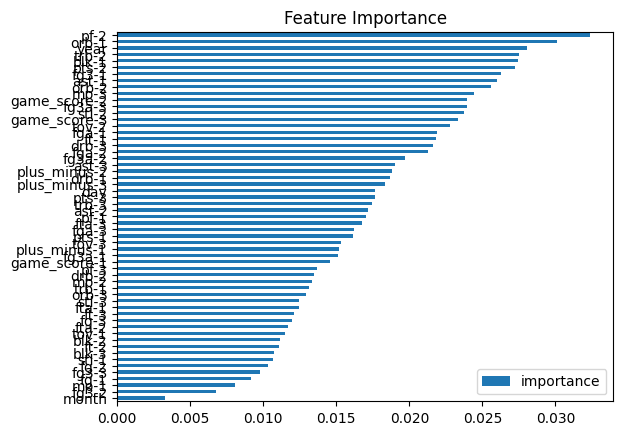

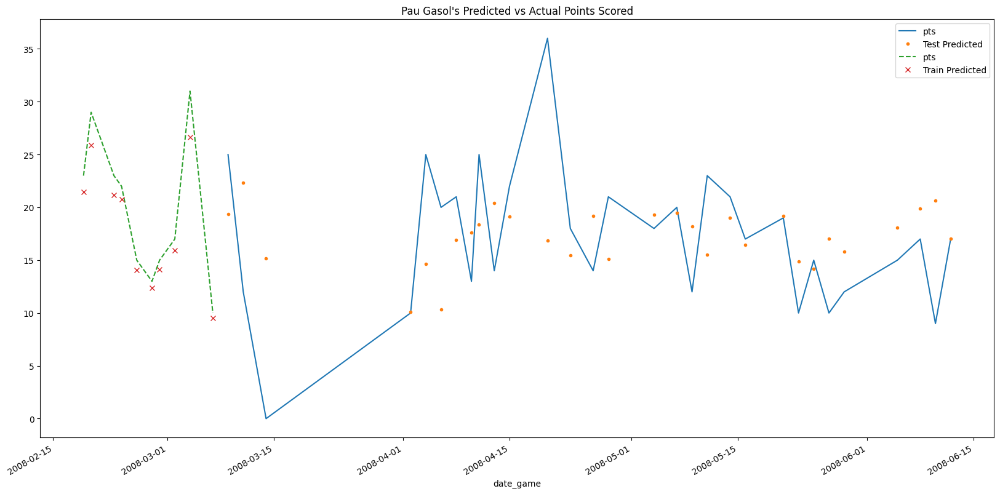

Score across folds 7.4983
Fold scores:[np.float64(6.502255137330758), np.float64(8.975575074828164), np.float64(7.017170817306838)]
2009-04-27


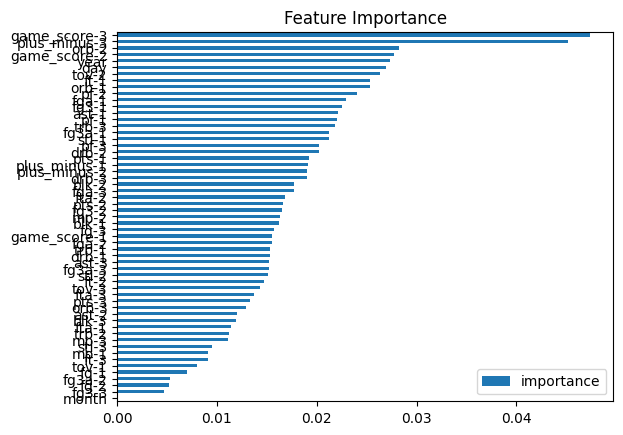

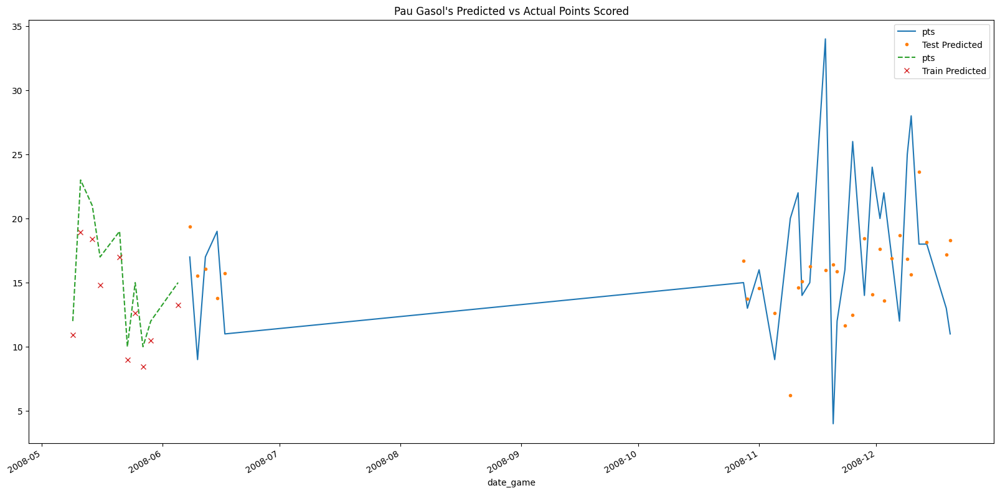

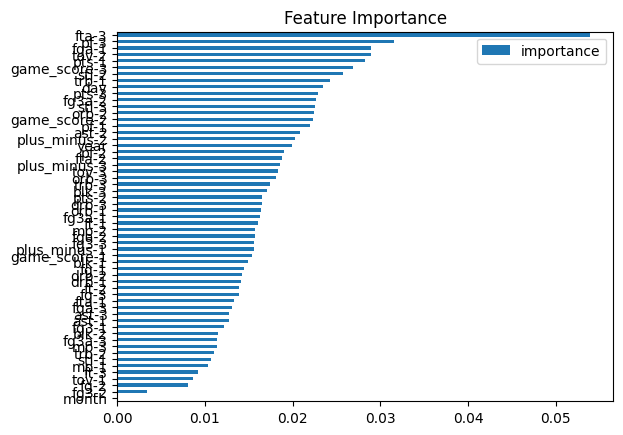

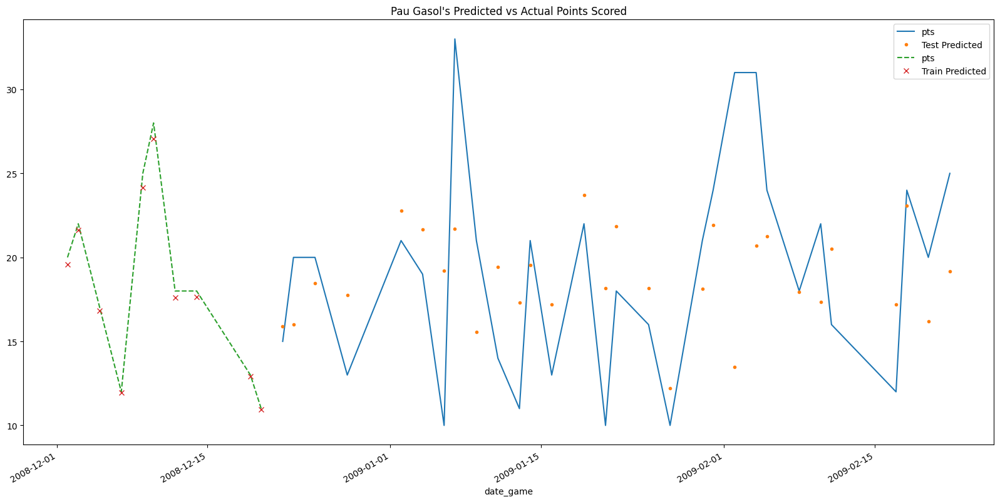

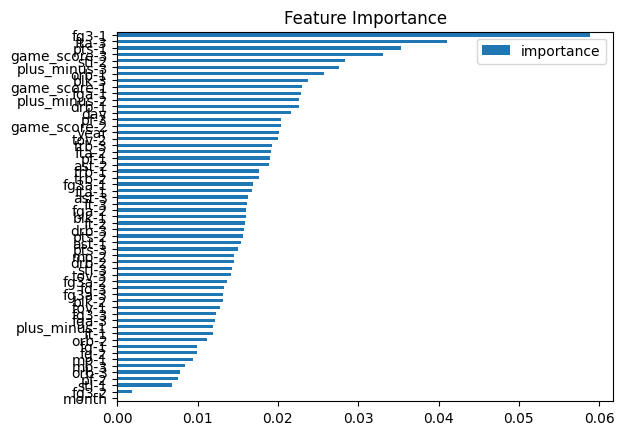

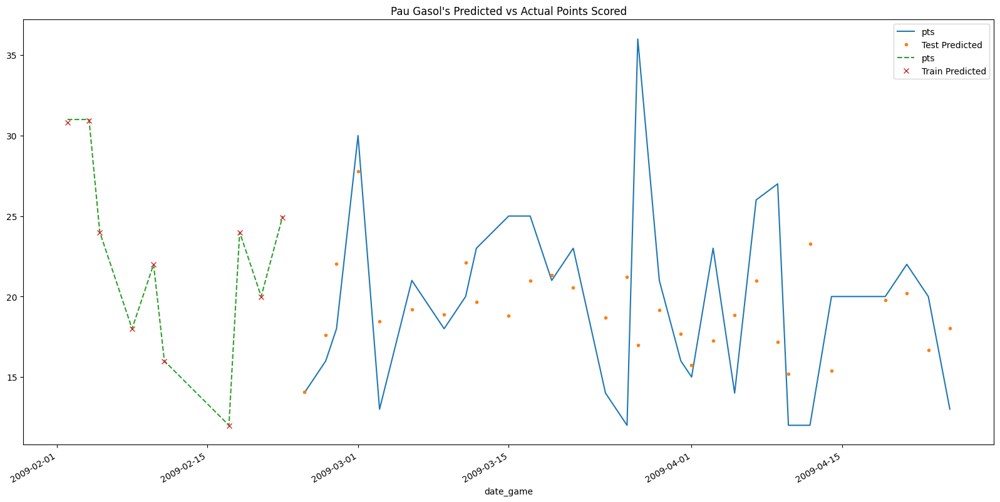

Score across folds 6.3113
Fold scores:[np.float64(7.350412349503831), np.float64(5.8531728756469015), np.float64(5.730251606575084)]
2009-05-04


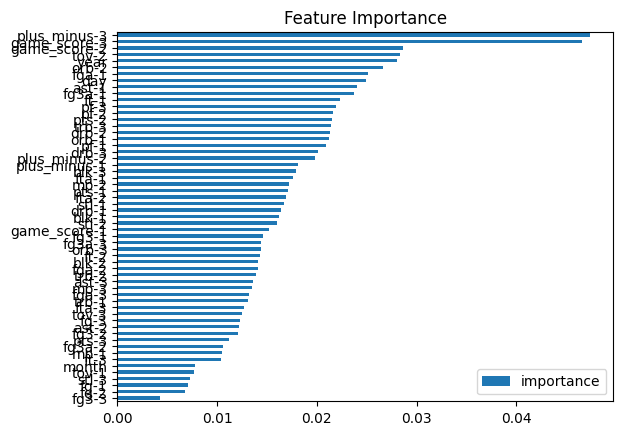

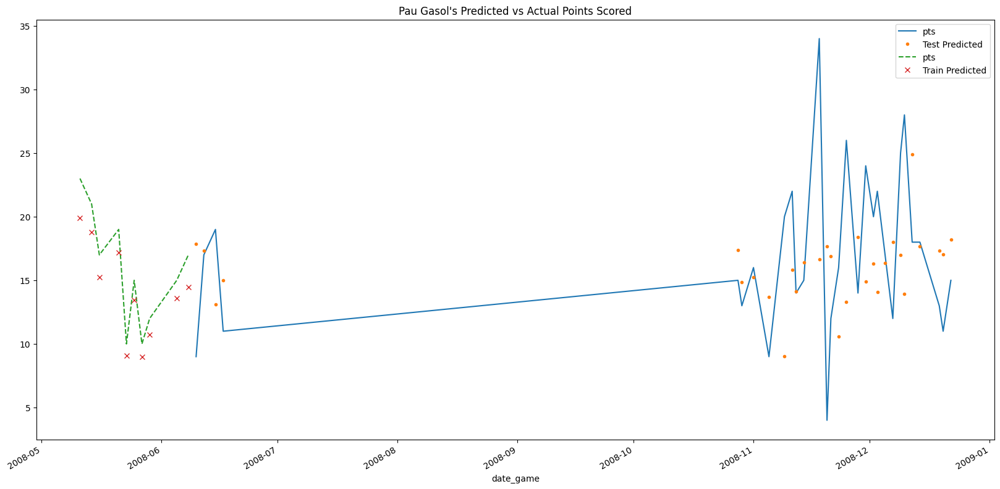

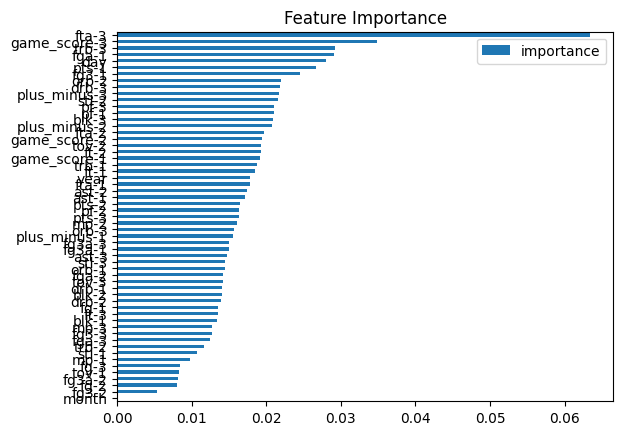

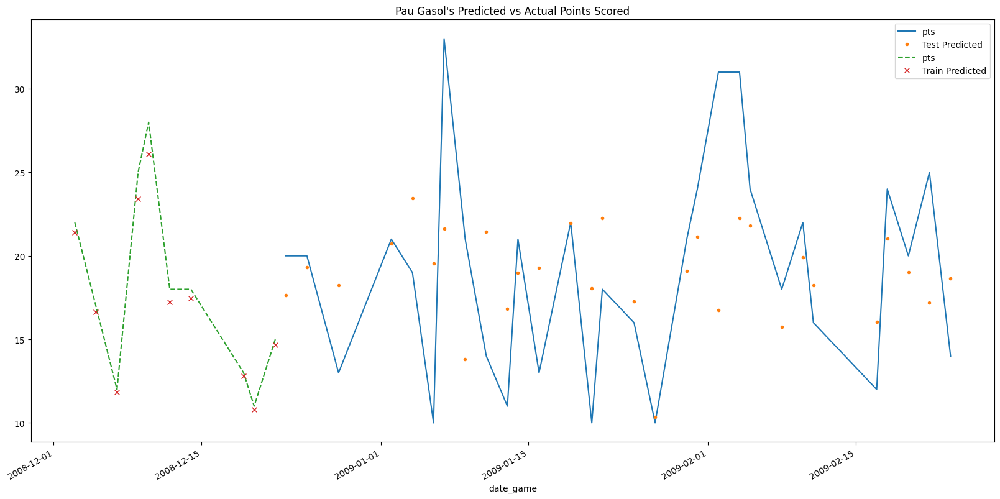

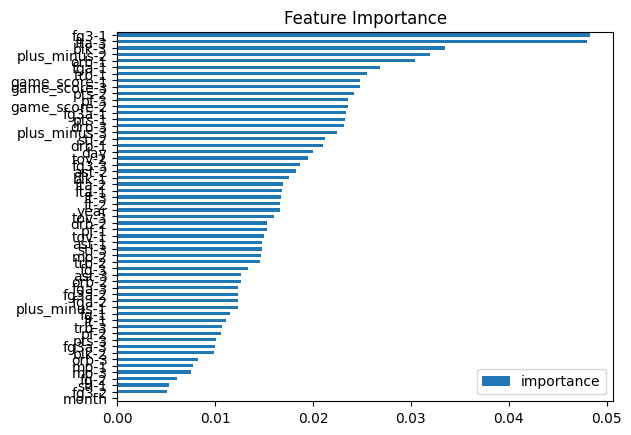

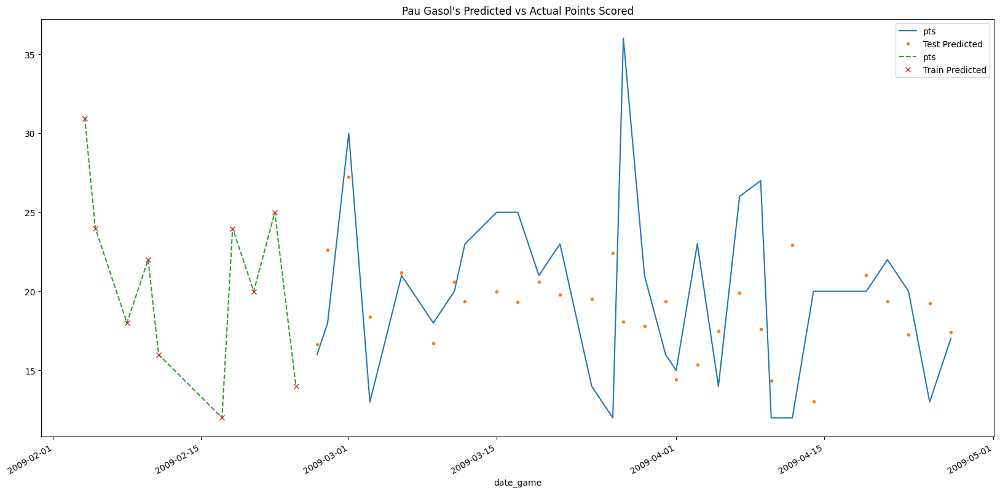

Score across folds 6.3023
Fold scores:[np.float64(7.332794831761866), np.float64(5.6674057265033415), np.float64(5.906749392536044)]
2009-06-07


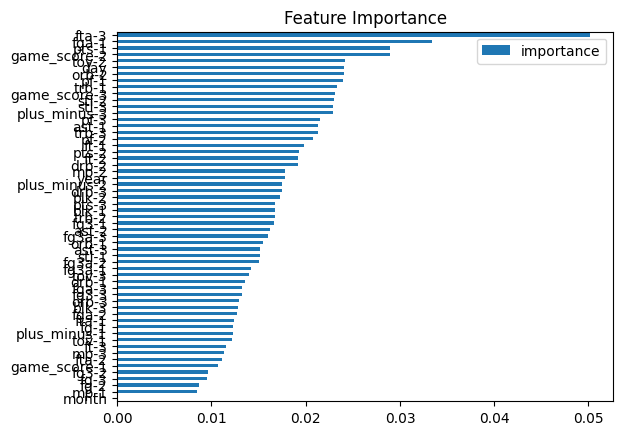

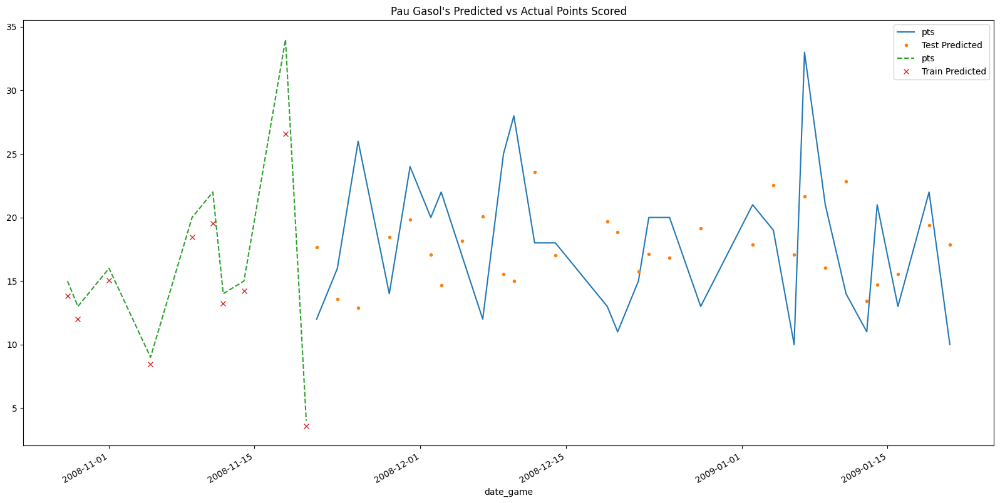

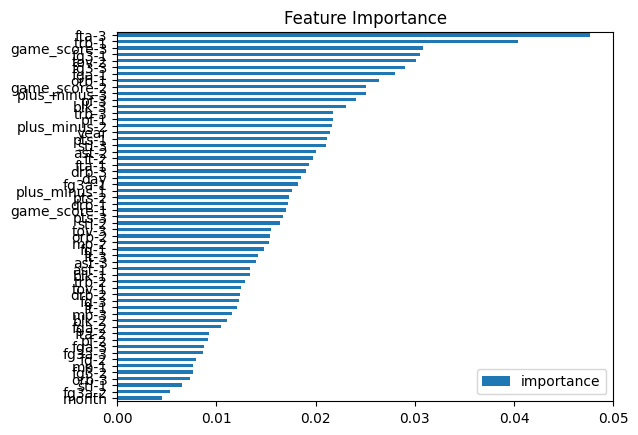

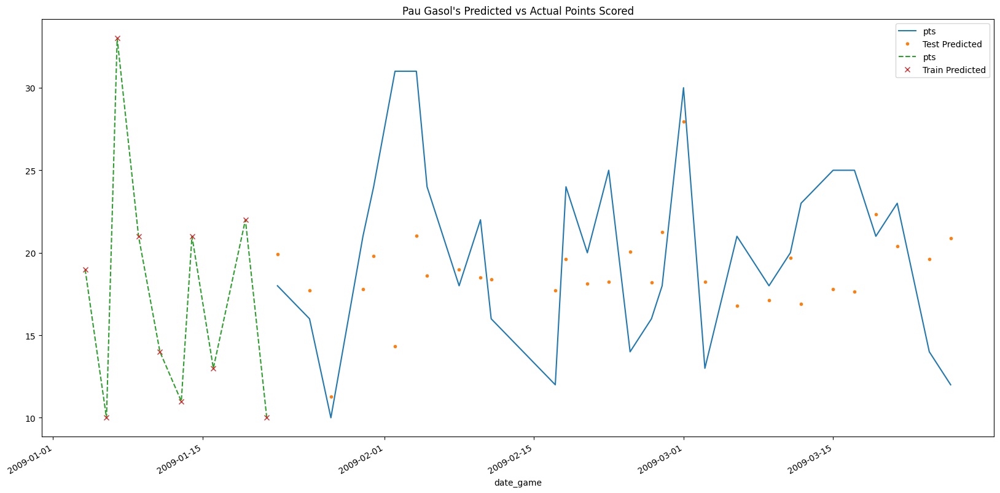

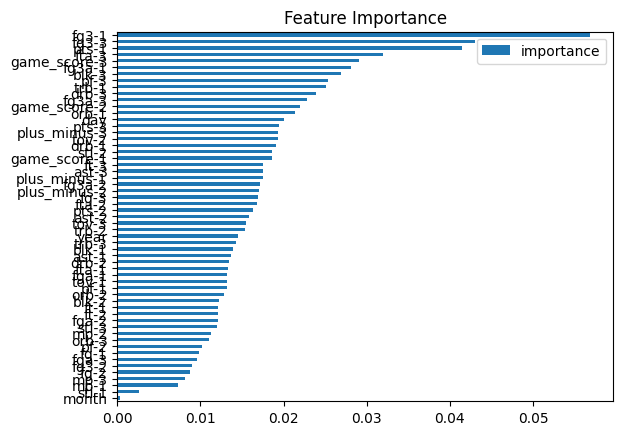

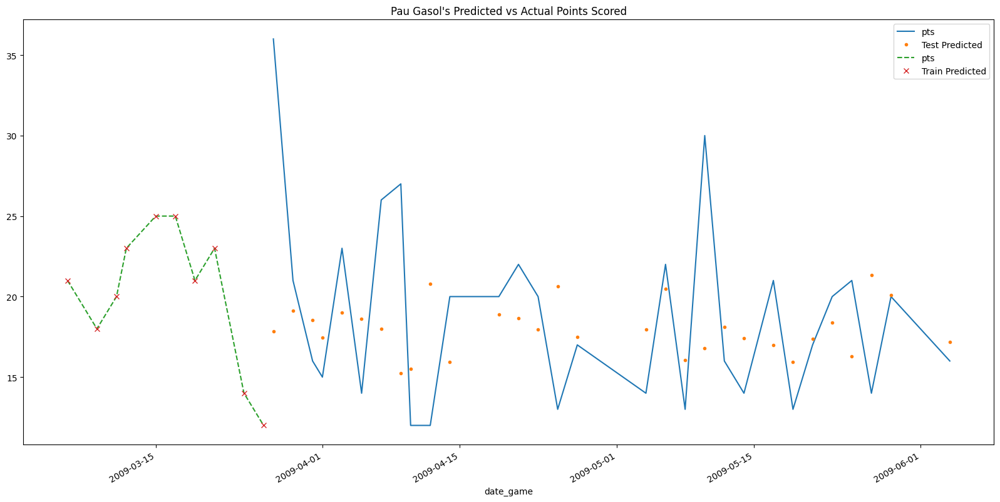

Score across folds 6.0157
Fold scores:[np.float64(6.461952343869047), np.float64(5.559874452563316), np.float64(6.025177333619397)]
2010-06-15


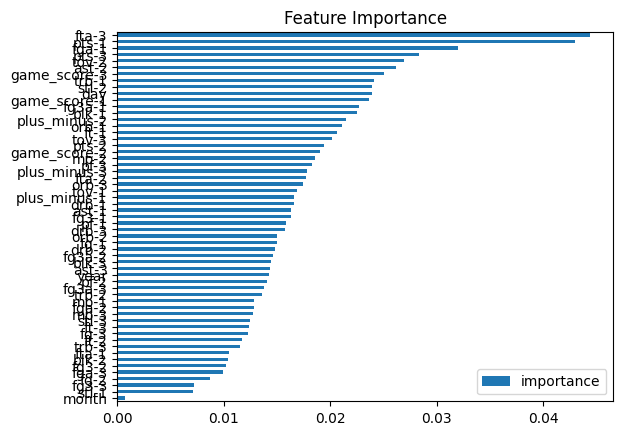

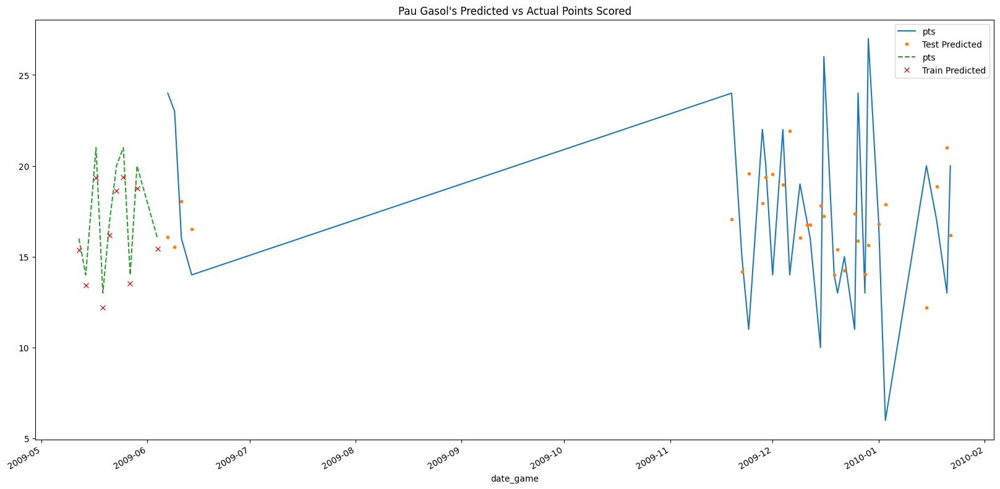

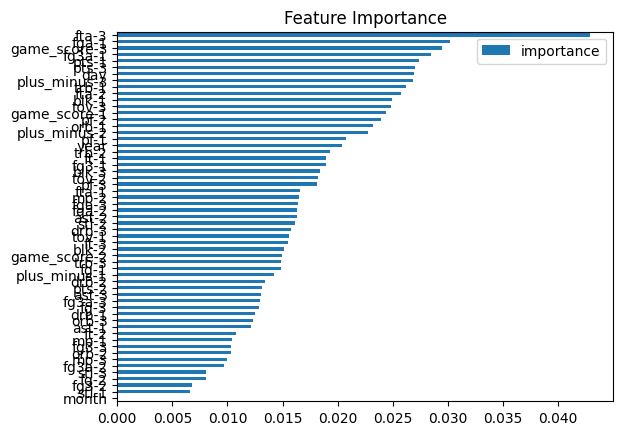

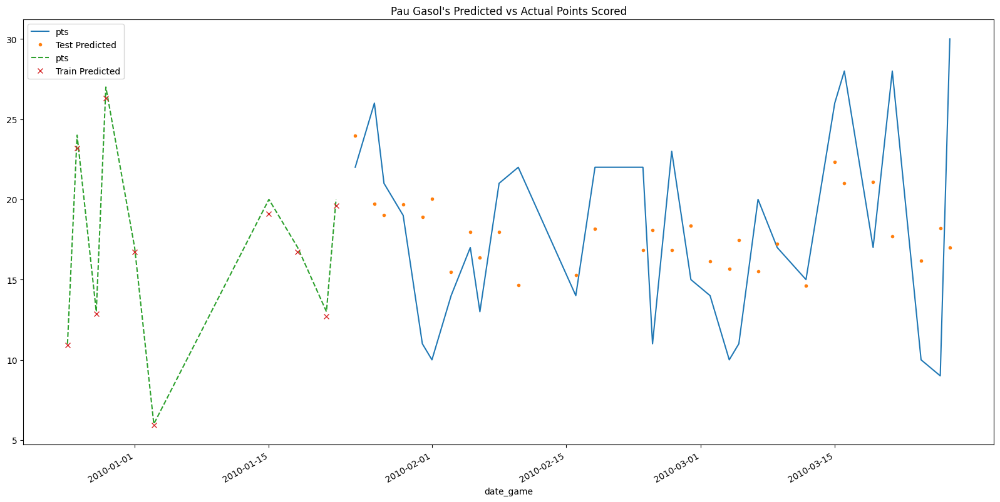

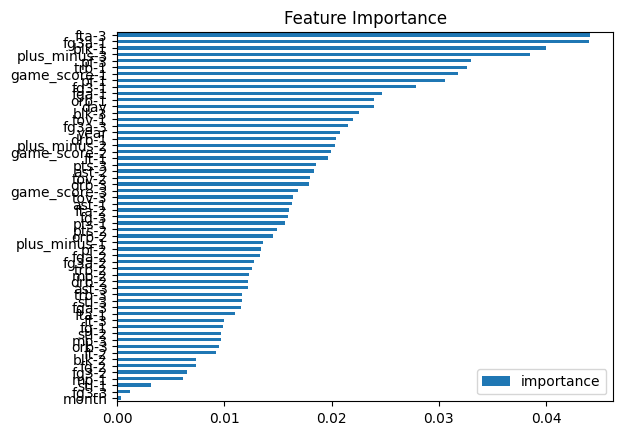

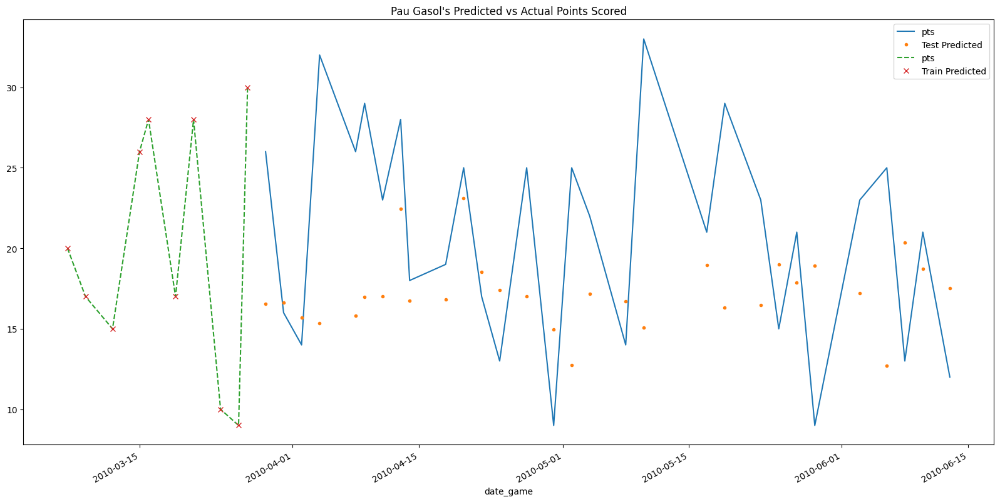

Score across folds 6.5697
Fold scores:[np.float64(5.90369667467545), np.float64(5.791219002348404), np.float64(8.014164599698555)]
2011-01-07


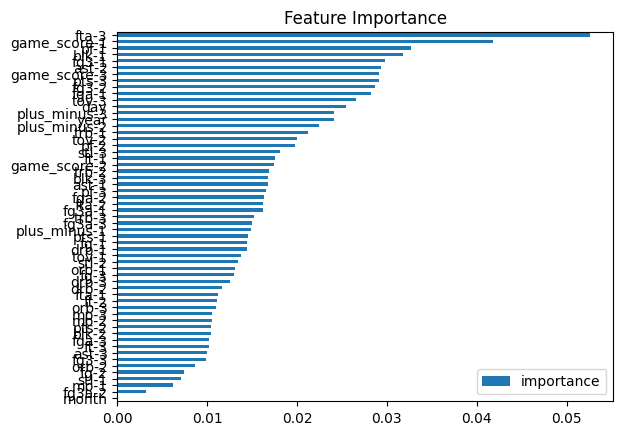

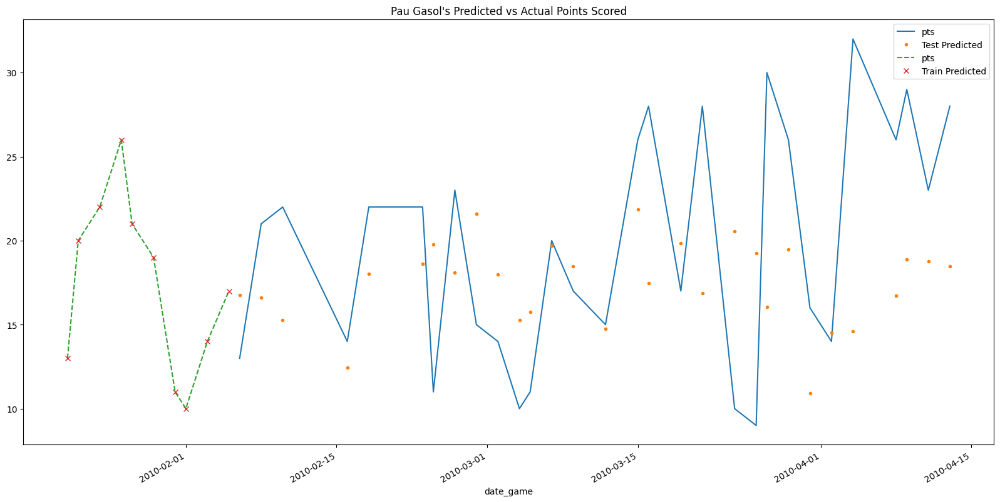

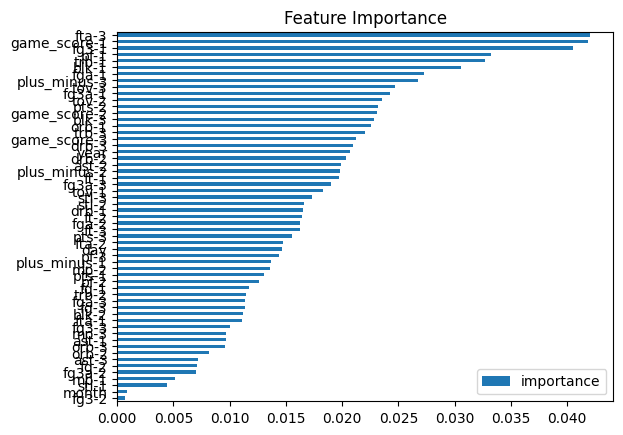

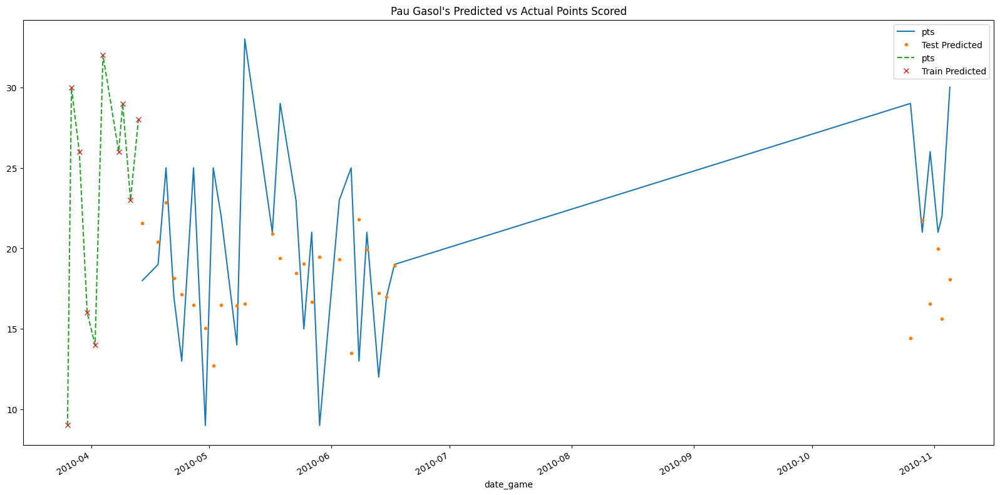

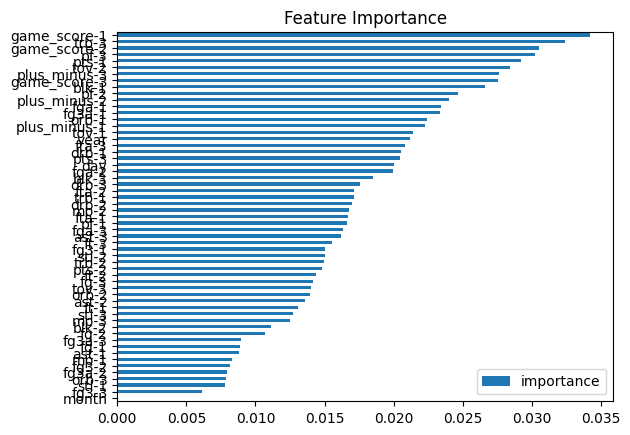

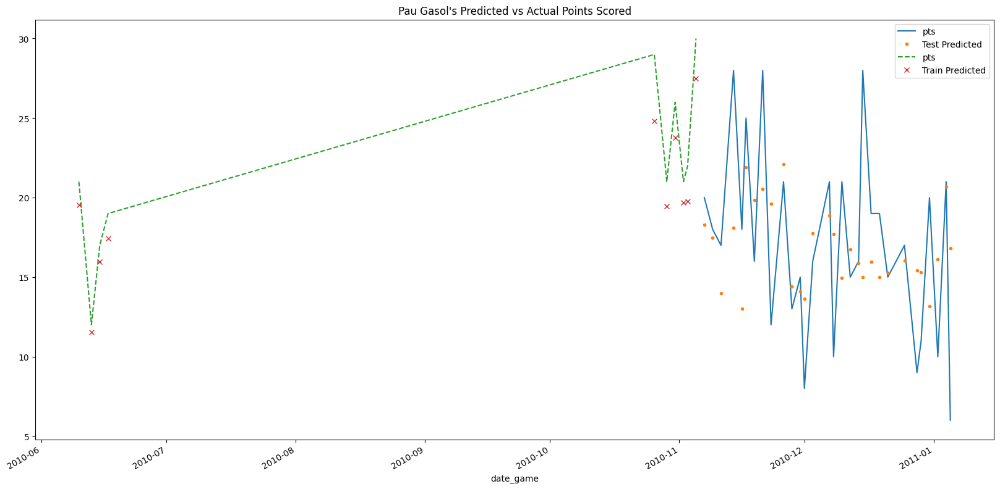

Score across folds 6.7138
Fold scores:[np.float64(7.4411254856388975), np.float64(7.305085969260629), np.float64(5.395312576996942)]
2013-10-29


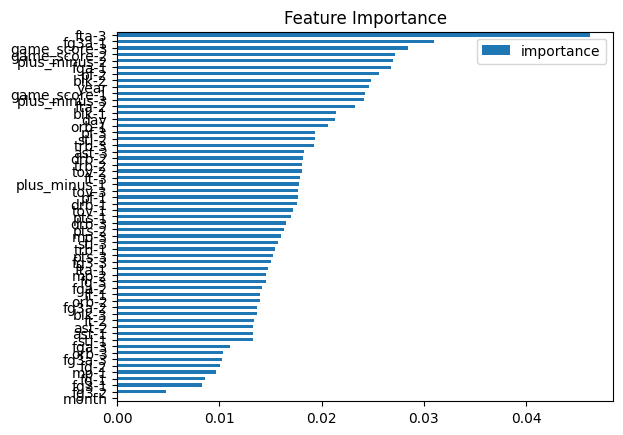

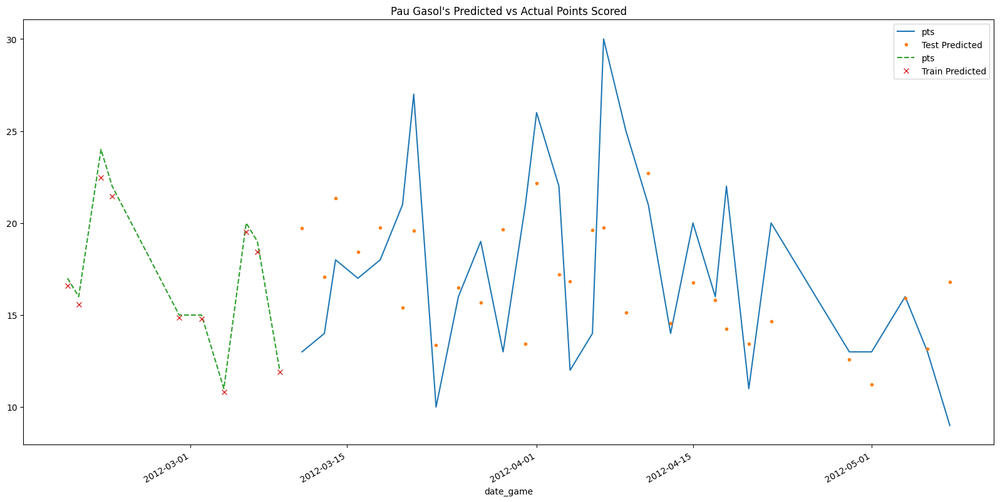

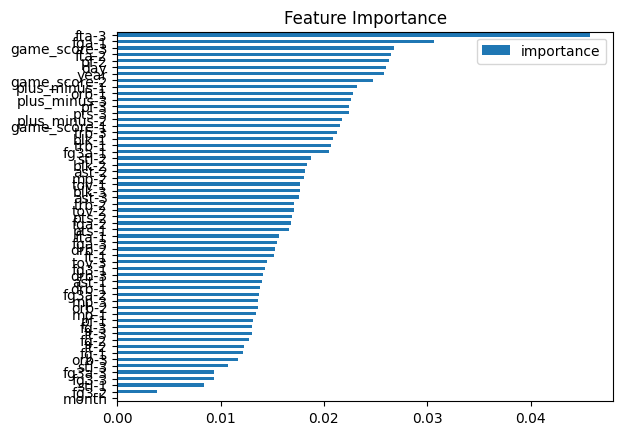

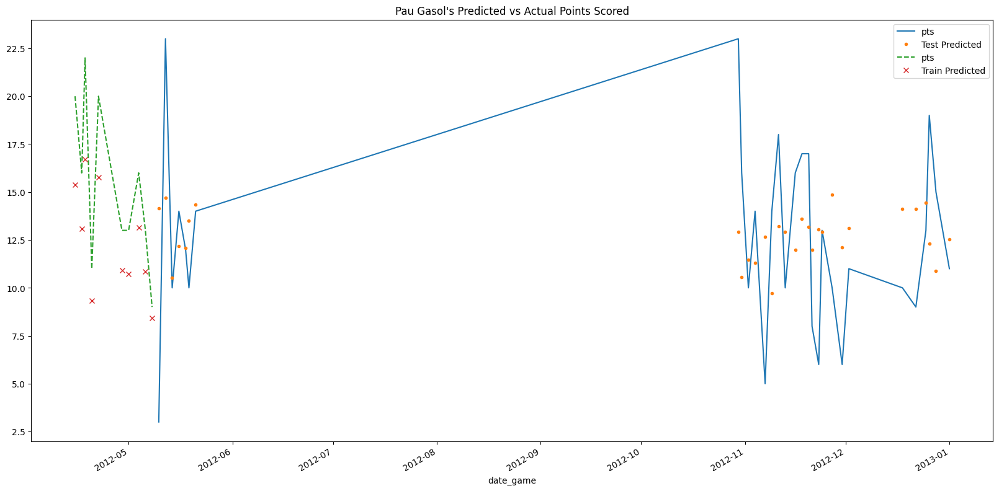

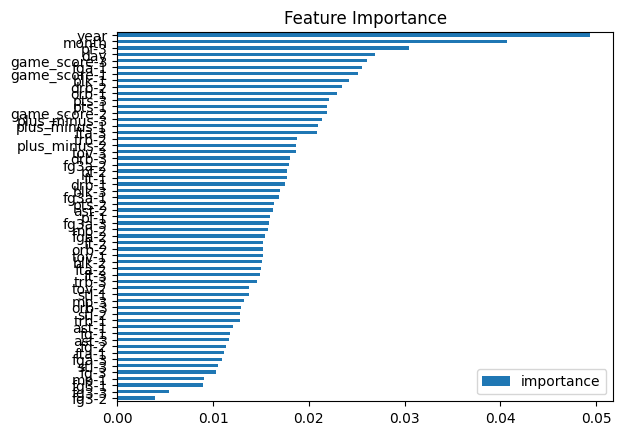

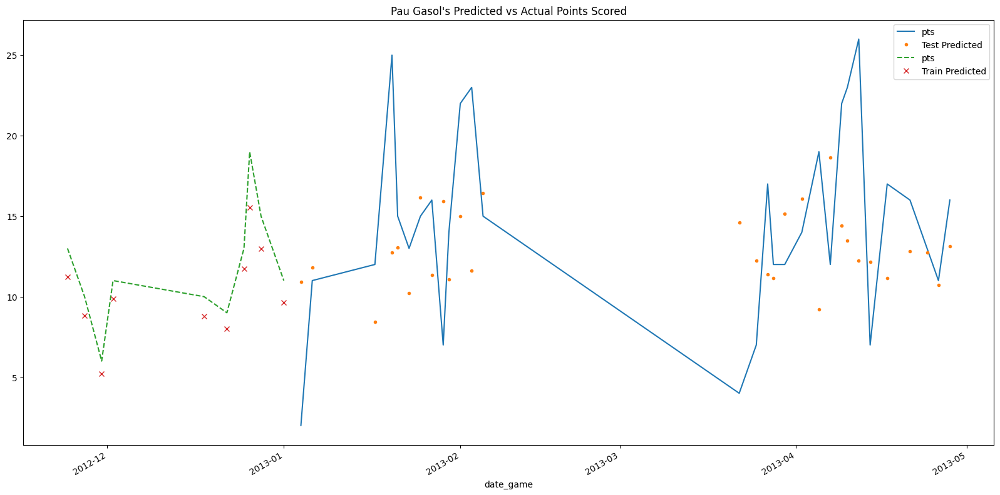

Score across folds 5.5063
Fold scores:[np.float64(4.995380117269317), np.float64(4.9697283656382725), np.float64(6.553914909027395)]


In [55]:
gasol_pts_predictions, gasol_pts_real = predict_per_date("Pau Gasol", lag_count = 3, y_stat = "pts", n_splits = 3, test_size = 30, verbose=False, max_depth = 15, visualize = True, plot_last_n=10, plt_title="Pau Gasol's Predicted vs Actual Points Scored")

In [45]:
gasol_pts_predictions

[np.float32(16.059084),
 np.float32(14.244501),
 np.float32(18.962694),
 np.float32(17.32176),
 np.float32(18.16988),
 np.float32(16.3704),
 np.float32(16.601452),
 np.float32(10.913951)]

In [34]:
gasol_pts_real

[529    12.0
 Name: pts, dtype: float64,
 534    19.0
 Name: pts, dtype: float64,
 621    17.0
 Name: pts, dtype: float64,
 622    14.0
 Name: pts, dtype: float64,
 636    24.0
 Name: pts, dtype: float64,
 726    17.0
 Name: pts, dtype: float64,
 764    21.0
 Name: pts, dtype: float64,
 950    15.0
 Name: pts, dtype: float64]

In [134]:
lebron = pd.read_csv('./Diddy-Stats/diddygames.csv')

In [135]:
lebron = lebron.loc[lebron['player'] == "LeBron James"]

In [139]:
lebron.select_dtypes(include='number').mean()

Unnamed: 0     3.285714
fg            11.285714
fga           21.142857
fg_pct         0.529429
fg3            1.285714
fg3a           3.857143
fg3_pct        0.352400
ft             7.285714
fta            9.714286
ft_pct         0.689571
orb            1.714286
drb            8.000000
trb            9.714286
ast            7.571429
stl            1.285714
blk            1.428571
tov            2.285714
pf             1.857143
pts           31.142857
game_score    28.042857
plus_minus    -0.142857
dtype: float64

In [140]:
lebron

,Unnamed: 0,player,team,mp,fg,fga,fg_pct,fg3,fg3a,fg3_pct,...,trb,ast,stl,blk,tov,pf,pts,game_score,plus_minus,date
66,10,LeBron James,CLE,46:13,19.0,30.0,0.633,2.0,5.0,0.400,...,13.0,8.0,2.0,1.0,2.0,3.0,41.0,36.2,-13.0,2017-06-12
203,10,LeBron James,CLE,44:03,17.0,33.0,0.515,2.0,7.0,0.286,...,9.0,11.0,0.0,2.0,3.0,1.0,52.0,42.9,7.0,2009-02-04
276,0,LeBron James,MIA,39:54,8.0,19.0,0.421,1.0,3.0,0.333,...,6.0,5.0,2.0,2.0,3.0,2.0,22.0,15.6,1.0,2011-05-01
331,0,LeBron James,LAL,45:28,8.0,18.0,0.444,1.0,7.0,0.143,...,20.0,7.0,0.0,2.0,1.0,3.0,22.0,23.9,8.0,2023-04-24
470,0,LeBron James,MIA,38:35,11.0,20.0,0.550,3.0,5.0,0.600,...,10.0,9.0,3.0,0.0,2.0,0.0,31.0,31.3,-17.0,2012-12-06
578,2,LeBron James,MIA,36:00,9.0,14.0,0.643,0.0,0.0,NaN,...,6.0,5.0,2.0,1.0,3.0,3.0,26.0,23.6,-7.0,2011-12-27
597,1,LeBron James,MIA,31:22,7.0,14.0,0.500,0.0,0.0,NaN,...,4.0,8.0,0.0,2.0,2.0,1.0,24.0,22.8,20.0,2011-01-31
